NLP Project (Tanisha Goyal - 19UCS259, Jaskaran Singh - 19UCS262, Anshu Kumari - 19DCS006)
We have chosen the two books:"Pride and Prejudice", by Jane Austen as first book t1 and "The Hounds of Baskerville", by Sir Arthur Conan Doyle as second book t2.

In [1]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to C:\Users\Tanisha
[nltk_data]     Goyal\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [2]:
from urllib.request import urlopen
url1 = "https://www.gutenberg.org/files/1342/1342-0.txt"
url2 = "https://www.gutenberg.org/files/2852/2852-0.txt"
t1 = urlopen(url1).read()
t2 = urlopen(url2).read()

In [3]:
print(type(t1))
print(type(t2))

<class 'bytes'>
<class 'bytes'>


The books are in bytes and so we convert them into string format by follwing functions:

In [4]:
raw_t1 = t1.decode('utf-8')
raw_t2 = t2.decode('utf-8')

Removal of running section / chapter names for both texts.

In [5]:
line_array_t1 = raw_t1.splitlines()
line_array_t2 = raw_t2.splitlines()

After getting the whole book in string format, we now extracted the text from where the chapter 1 starts till the end of the last chapter for both books in the following two blocks.
index_start is the start of chapter 1 and index_end is the end of last chapter for both books.

In [6]:
index_start = 0
index_end = 0
for line in line_array_t1[0:]:
    if line == "Chapter 1":
        print(index_start)
    if line == "*** END OF THE PROJECT GUTENBERG EBOOK PRIDE AND PREJUDICE ***":
        print(index_end)
        break
    index_start += 1
    index_end += 1

167
14231


In [7]:
index_start = 0
index_end = 0
for line in line_array_t2[0:]:
    if line == "Chapter 1.":
        print(index_start)
    if line == "*** END OF THE PROJECT GUTENBERG EBOOK THE HOUND OF THE BASKERVILLES ***":
        print(index_end)
        break
    index_start += 1
    index_end += 1

81
7381


Now we remove the chapter headings and unwanted texts for both books.
First we make a array of all the chapter names (using regex because all the chapter headings are written in the same manner in each book) and then remove them later chapter by chapter and then also remove the unwanted spaces such as the running sections and then also replace the tab spaces with single spaces and convert the text into string by using function 'join'

For t1: first removing the unwanted spaces-

In [8]:
temp_t1 = line_array_t1[167:14227]
t1_join = ''.join(temp_t1)
t1_join = t1_join.replace('      ',' ')
t1_join[:1000]

'Chapter 1 It is a truth universally acknowledged, that a single man in possession of a good fortune, must be in want of a wife. However little known the feelings or views of such a man may be on his first entering a neighbourhood, this truth is so well fixed in the minds of the surrounding families, that he is considered as the rightful property of some one or other of their daughters. “My dear Mr. Bennet,” said his lady to him one day, “have you heard that Netherfield Park is let at last?” Mr. Bennet replied that he had not. “But it is,” returned she; “for Mrs. Long has just been here, and she told me all about it.” Mr. Bennet made no answer. “Do not you want to know who has taken it?” cried his wife impatiently. “_You_ want to tell me, and I have no objection to hearing it.” This was invitation enough. “Why, my dear, you must know, Mrs. Long says that Netherfield is taken by a young man of large fortune from the north of England; that he came down on Monday in a chaise and four to s

for t1: now removing the chapter headings-

In [9]:
import regex as REG
reg = r'Chapter [0-9][0-9]?'
t1_join = REG.sub(reg,"",t1_join)
t1_join = t1_join[1:]
t1_join[:1000]

'It is a truth universally acknowledged, that a single man in possession of a good fortune, must be in want of a wife. However little known the feelings or views of such a man may be on his first entering a neighbourhood, this truth is so well fixed in the minds of the surrounding families, that he is considered as the rightful property of some one or other of their daughters. “My dear Mr. Bennet,” said his lady to him one day, “have you heard that Netherfield Park is let at last?” Mr. Bennet replied that he had not. “But it is,” returned she; “for Mrs. Long has just been here, and she told me all about it.” Mr. Bennet made no answer. “Do not you want to know who has taken it?” cried his wife impatiently. “_You_ want to tell me, and I have no objection to hearing it.” This was invitation enough. “Why, my dear, you must know, Mrs. Long says that Netherfield is taken by a young man of large fortune from the north of England; that he came down on Monday in a chaise and four to see the pla

Same steps done for t2: Same steps for t2:
removing unwanted spaces, extracting chapters, converting them to string and then removing the chapter headings-

In [10]:
import regex as REG

temp_t2 = line_array_t2[81:7380]
t2_join = ''.join(temp_t2)
t2_join = t2_join.replace('      ',' ')
t2_join[:1000]

chapters = []
reg = r'Chapter [0-9][0-9]?'
for each_line in line_array_t2[:80]:
    if bool(REG.search(reg, each_line)):
        each_line = REG.sub("  ",".",each_line)
        temp = each_line[1:]
        chapters.append(temp)
print(chapters)

for chap in chapters:
    t2_join = t2_join.replace(chap,"")
t2_join = t2_join[1:]
t2_join[:1000]

['Chapter 1.Mr. Sherlock Holmes', 'Chapter 2.The Curse of the Baskervilles', 'Chapter 3.The Problem', 'Chapter 4.Sir Henry Baskerville', 'Chapter 5.Three Broken Threads', 'Chapter 6.Baskerville Hall', 'Chapter 7.The Stapletons of Merripit House', 'Chapter 8.First Report of Dr. Watson', 'Chapter 9.The Light upon the Moor [Second Report of Dr. Watson]', 'Chapter 10 Extract from the Diary of Dr. Watson', 'Chapter 11 The Man on the Tor', 'Chapter 12 Death on the Moor', 'Chapter 13 Fixing the Nets', 'Chapter 14 The Hound of the Baskervilles', 'Chapter 15 A Retrospection']


'Mr. Sherlock Holmes, who was usually very late in the mornings, save upon those not infrequent occasions when he was up all night, was seated at the breakfast table. I stood upon the hearth-rug and picked up the stick which our visitor had left behind him the night before. It was a fine, thick piece of wood, bulbous-headed, of the sort which is known as a “Penang lawyer.” Just under the head was a broad silver band nearly an inch across. “To James Mortimer, M.R.C.S., from his friends of the C.C.H.,” was engraved upon it, with the date “1884.” It was just such a stick as the old-fashioned family practitioner used to carry—dignified, solid, and reassuring. “Well, Watson, what do you make of it?” Holmes was sitting with his back to me, and I had given him no sign of my occupation. “How did you know what I was doing? I believe you have eyes in the back of your head.” “I have, at least, a well-polished, silver-plated coffee-pot in front of me,” said he. “But, tell me, Watson, what do you m

Now we will tokenize both the texts(strings) t1 and t2:
We will extract there tokens as follows:-
(and will also output the first 15 tokens for each book, just for visualisation)

In [11]:
t1_toks = nltk.word_tokenize(t1_join)
t1_toks[:15]

['It',
 'is',
 'a',
 'truth',
 'universally',
 'acknowledged',
 ',',
 'that',
 'a',
 'single',
 'man',
 'in',
 'possession',
 'of',
 'a']

In [12]:
t2_toks = nltk.word_tokenize(t2_join)
t2_toks[:15]

['Mr.',
 'Sherlock',
 'Holmes',
 ',',
 'who',
 'was',
 'usually',
 'very',
 'late',
 'in',
 'the',
 'mornings',
 ',',
 'save',
 'upon']

Now we will analyze the frequency distributions of the tokens of both books separately:
For that we want to get the unique number of tokens for each text and so we will first convert the token lists into arrays and then we get their unique counts(these unique counts is theirfrequency distribution) and output them using following functions:-

For t1 frequency distribution of its tokens: 

In [13]:
import pandas as PND
t1_toks_array = PND.Series(t1_toks)
t1_frequency_dist = t1_toks_array.value_counts()
t1_frequency_dist

,              9146
.              4079
to             4075
the            4051
of             3583
               ... 
circumspect       1
deceives          1
Women             1
should.           1
uniting           1
Length: 7723, dtype: int64

For t2 frequency distribution of its tokens: 

In [14]:
t2_toks_array = PND.Series(t2_toks)
t2_frequency_dist = t2_toks_array.value_counts()
t2_frequency_dist

,          3433
the        3061
.          2497
of         1582
and        1505
           ... 
stained       1
stags         1
lit           1
boyish        1
END           1
Length: 6514, dtype: int64

Creating the word clouds for t1 and t2 using the tokens we got:

For t1: Creating it's word cloud and showing it as a figure-

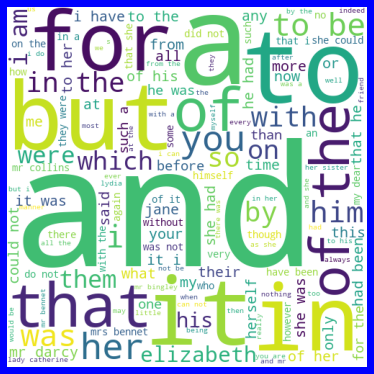

In [15]:
import matplotlib.pyplot as PLOT
from wordcloud import WordCloud

t1_comments = ''
for i in range(len(t1_toks)): 
    t1_toks[i] = t1_toks[i].lower() 
      
t1_comments += " ".join(t1_toks)+" "

t1_cloud = WordCloud(width = 500, height = 500, 
                background_color ='white', 
                min_font_size = 10 , stopwords={','}).generate(t1_comments)

PLOT.figure(figsize = (5, 5), facecolor = 'blue') 
PLOT.imshow(t1_cloud) 
PLOT.axis("off") 
PLOT.tight_layout(pad = 0) 
PLOT.show()

Similarly, for t2: Creating it's word cloud and showing it as a figure-

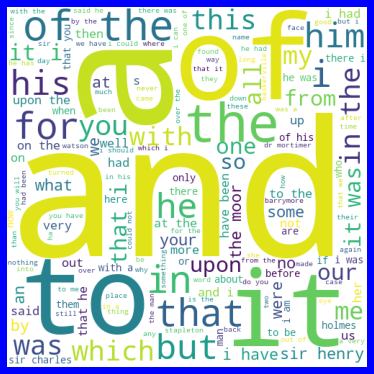

In [16]:
t2_comments = ''
for i in range(len(t2_toks)): 
    t2_toks[i] = t2_toks[i].lower() 
      
t2_comments += " ".join(t2_toks)+" "

t2_cloud = WordCloud(width = 500, height = 500, 
                background_color ='white', 
                min_font_size = 10 , stopwords={','}).generate(t2_comments)

PLOT.figure(figsize = (5, 5), facecolor = 'blue') 
PLOT.imshow(t2_cloud) 
PLOT.axis("off") 
PLOT.tight_layout(pad = 0) 
PLOT.show()

Now we will remove the stop words from both t1 and t2:
First we download the stopwords from nltk and then remove them from t1 and t2 and then again create their word clouds:

In [17]:
nltk.download('stopwords')
from nltk.corpus import stopwords
english_stopwords = stopwords.words('english')

[nltk_data] Downloading package stopwords to C:\Users\Tanisha
[nltk_data]     Goyal\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


For t1: Creating it's word cloud without stopwords-

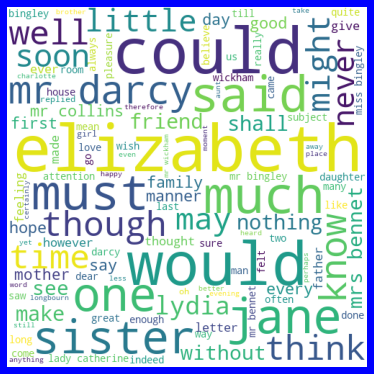

In [18]:
t1_cloud = WordCloud(width = 500, height = 500, 
                background_color ='white', 
                min_font_size = 10 , stopwords = english_stopwords).generate(t1_comments)

PLOT.figure(figsize = (5, 5), facecolor = 'blue') 
PLOT.imshow(t1_cloud) 
PLOT.axis("off") 
PLOT.tight_layout(pad = 0) 
PLOT.show()

Similarly, for t2: Creating it's word cloud without stopwords-

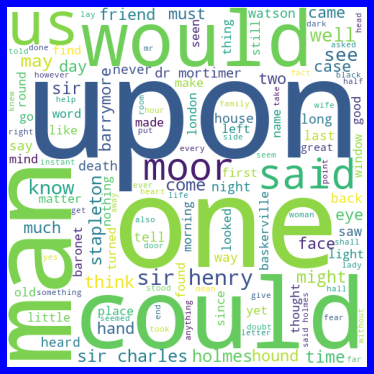

In [19]:
t2_cloud = WordCloud(width = 500, height = 500, 
                background_color ='white', 
                min_font_size = 10 , stopwords = english_stopwords).generate(t2_comments)

PLOT.figure(figsize = (5, 5), facecolor = 'blue') 
PLOT.imshow(t2_cloud) 
PLOT.axis("off") 
PLOT.tight_layout(pad = 0) 
PLOT.show()

Now we will analyze the relation between the word length and their frequency for both t1 and t2:

For t1: First we print the mapping between the word length and their frequency-

In [20]:
t1_frequency_len = {}
for token in t1_toks:
    word_length = len(token)
    if word_length in t1_frequency_len:
        t1_frequency_len[word_length] = t1_frequency_len[word_length] + 1
    else:
        t1_frequency_len[word_length] = 1
print(t1_frequency_len)

{2: 22388, 1: 24805, 5: 11866, 11: 1432, 12: 870, 4: 21986, 6: 8974, 3: 28660, 10: 2387, 7: 8368, 8: 5067, 13: 445, 9: 4962, 14: 135, 16: 23, 15: 63, 17: 12, 18: 4, 22: 2, 20: 2, 19: 2, 24: 1, 27: 1}


Now we plot them as shown-

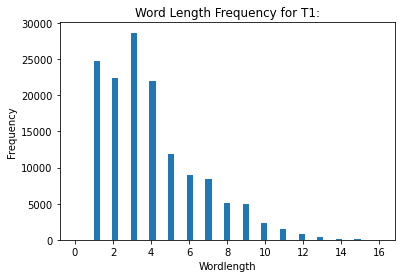

In [21]:
import numpy as NP
size_bin = NP.linspace(0,16)
wordLength = [len(r) for r in t1_toks]
PLOT.hist(wordLength, bins=size_bin)
PLOT.xlabel("Wordlength")
PLOT.ylabel("Frequency")
PLOT.title("Word Length Frequency for T1:")
PLOT.show()

Similarly, for t2: Printing the mapping and ploting the histagram-

{3: 14201, 8: 2005, 6: 4441, 1: 13013, 7: 3526, 4: 11495, 2: 10922, 5: 6411, 10: 843, 9: 1525, 14: 49, 13: 123, 12: 259, 15: 18, 11: 512, 16: 12, 22: 1, 20: 1, 18: 3, 17: 2, 23: 1, 21: 1}


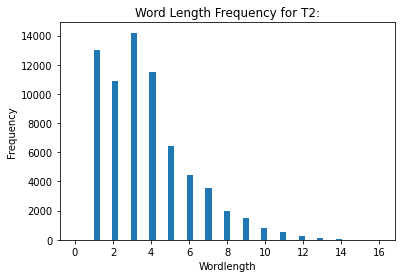

In [22]:
t2_frequency_len = {}
for token in t2_toks:
    word_length = len(token)
    if word_length in t2_frequency_len:
        t2_frequency_len[word_length] = t2_frequency_len[word_length] + 1
    else:
        t2_frequency_len[word_length] = 1
print(t2_frequency_len)

wordLength = [len(r) for r in t2_toks]
PLOT.hist(wordLength, bins=size_bin)
PLOT.xlabel("Wordlength")
PLOT.ylabel("Frequency")
PLOT.title("Word Length Frequency for T2:")
PLOT.show()

Now we will do the POS tagging for both t1 and t2 using "Penn Tree Bank Tagset" and the default tagger of nltk.

'nltk.pos_tag' the default tagger of nltk uses "Penn Tree Bank Tagset".

For t1: Printing the first 20 tags and then showing frequency distribution of the tags-

In [23]:
import nltk
t1_tags =nltk.pos_tag(t1_toks)

In [24]:
for i in t1_tags[:20]:
    print(i)

('it', 'PRP')
('is', 'VBZ')
('a', 'DT')
('truth', 'NN')
('universally', 'RB')
('acknowledged', 'VBD')
(',', ',')
('that', 'IN')
('a', 'DT')
('single', 'JJ')
('man', 'NN')
('in', 'IN')
('possession', 'NN')
('of', 'IN')
('a', 'DT')
('good', 'JJ')
('fortune', 'NN')
(',', ',')
('must', 'MD')
('be', 'VB')


Counter({'NN': 21425, 'IN': 15209, 'JJ': 9308, 'DT': 9159, 'PRP': 9152, ',': 9146, 'RB': 8849, 'VBD': 7804, 'VB': 7424, 'CC': 5071, '.': 5035, 'PRP$': 4817, 'TO': 4124, 'VBN': 3831, 'NNS': 3649, 'MD': 2867, 'VBP': 2540, 'VBG': 2173, 'NNP': 2067, 'VBZ': 1789, ':': 1668, 'WP': 842, 'WRB': 755, 'WDT': 712, 'CD': 545, 'JJR': 377, 'JJS': 333, 'RP': 302, 'PDT': 291, 'EX': 281, 'RBR': 271, 'FW': 225, 'RBS': 141, 'UH': 122, 'WP$': 59, "''": 55, '(': 18, ')': 18, 'NNPS': 1})


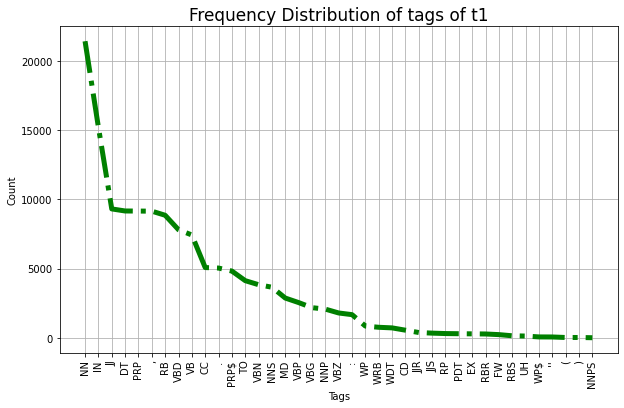

In [25]:
from collections import Counter
t1_counts = Counter(tag for word,  tag in t1_tags)
print(t1_counts)

t1_tags_freq = nltk.FreqDist(t1_counts)
t1_tags_freq = {k: v for k, v in sorted(t1_tags_freq.items(), key=lambda item: item[1],reverse=True)}
x = list(t1_tags_freq.keys())[:50]
y = list(t1_tags_freq.values())[:50]
PLOT.figure(figsize=(10,6))
PLOT.plot(x,y,c='g',lw=5,ls='-.')
PLOT.grid()
PLOT.xticks(rotation=90)
PLOT.title('Frequency Distribution of tags of t1',size=17)
PLOT.xlabel('Tags',size=10)
PLOT.ylabel('Count',size=10)
PLOT.show()

Similarly, for t2: The first 20 tags and then showing frequency distribution of the tags-

In [26]:
t2_tags =nltk.pos_tag(t2_toks)
for i in t2_tags[:20]:
    print(i)

('mr.', 'NN')
('sherlock', 'NN')
('holmes', 'NNS')
(',', ',')
('who', 'WP')
('was', 'VBD')
('usually', 'RB')
('very', 'RB')
('late', 'RB')
('in', 'IN')
('the', 'DT')
('mornings', 'NNS')
(',', ',')
('save', 'VBP')
('upon', 'IN')
('those', 'DT')
('not', 'RB')
('infrequent', 'JJ')
('occasions', 'NNS')
('when', 'WRB')


Counter({'NN': 11581, 'IN': 7709, 'DT': 6173, 'JJ': 5018, 'PRP': 4422, 'VBD': 3742, ',': 3433, 'RB': 3344, '.': 3197, 'VB': 2933, 'CC': 2242, 'NNS': 2063, 'PRP$': 1804, 'VBN': 1593, 'VBP': 1464, 'TO': 1407, 'VBZ': 1273, 'MD': 1176, 'NNP': 1111, 'VBG': 796, 'WDT': 492, 'WP': 385, 'WRB': 381, 'CD': 375, 'RP': 316, 'EX': 242, 'JJR': 144, 'PDT': 100, 'RBR': 98, 'JJS': 77, 'UH': 67, ':': 61, "''": 55, 'RBS': 43, 'FW': 25, 'WP$': 9, '(': 5, ')': 5, 'NNPS': 2, '$': 1})


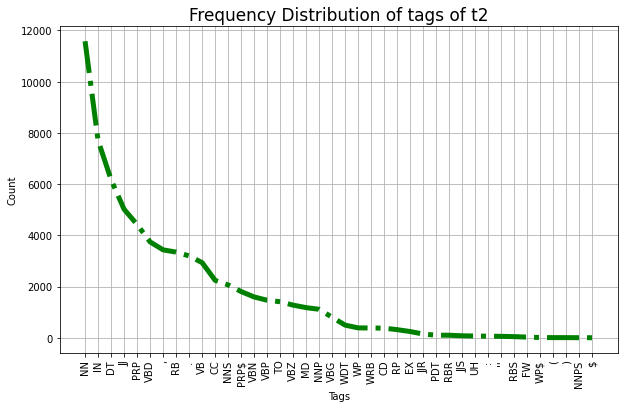

In [27]:
t2_counts = Counter(tag for word,  tag in t2_tags)
print(t2_counts)

t2_tags_freq = nltk.FreqDist(t2_counts)
t2_tags_freq = {k: v for k, v in sorted(t2_tags_freq.items(), key=lambda item: item[1],reverse=True)}
x = list(t2_tags_freq.keys())[:50]
y = list(t2_tags_freq.values())[:50]
PLOT.figure(figsize=(10,6))
PLOT.plot(x,y,c='g',lw=5,ls='-.')
PLOT.grid()
PLOT.xticks(rotation=90)
PLOT.title('Frequency Distribution of tags of t2',size=17)
PLOT.xlabel('Tags',size=10)
PLOT.ylabel('Count',size=10)
PLOT.show()

Finding and categorizing nouns and verbs for both the books:

For t1: using "t1_tags" which contains the tag for each wordd in t1 we will first create list of all the nouns in t1:

In [28]:
t1_nouns = []
for item in t1_tags:
    if(item[1]=="NN" or item[1]=="NNP" or item[1]=="NNPS" or item[1]=="NNS"):
        t1_nouns.append(item)
len(t1_nouns)

27142

Now we will categorize the found nouns for t1 by creating a dictionary for the same:

In [29]:
t1_noun_dict={}
import nltk
nltk.download('wordnet')
from nltk.corpus import wordnet
for item in t1_nouns:
    syn=wordnet.synsets(item[0])
    for i in syn:
        if i.lexname()[0]=='n':
            if i.lexname() in t1_noun_dict:
                t1_noun_dict[i.lexname()] += 1
            else:
                t1_noun_dict[i.lexname()] = 1
print(t1_noun_dict)

[nltk_data] Downloading package wordnet to C:\Users\Tanisha
[nltk_data]     Goyal\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


{'noun.cognition': 9046, 'noun.state': 4755, 'noun.communication': 12286, 'noun.attribute': 7103, 'noun.person': 13037, 'noun.animal': 668, 'noun.location': 3269, 'noun.artifact': 6463, 'noun.act': 8566, 'noun.Tops': 843, 'noun.motive': 260, 'noun.phenomenon': 704, 'noun.possession': 1476, 'noun.object': 942, 'noun.feeling': 2493, 'noun.group': 5366, 'noun.plant': 805, 'noun.time': 5884, 'noun.substance': 1930, 'noun.quantity': 3216, 'noun.relation': 956, 'noun.event': 2278, 'noun.body': 868, 'noun.process': 245, 'noun.shape': 447, 'noun.food': 719}


Similarly, for t1: we will now categorize different categories of verbs:

In [30]:
t1_verbs = []
for item in t1_tags:
    if(item[1]=="VB" or item[1]=="VBD" or item[1]=="VBG" or item[1]=="VBN" or item[1]=="VBP"or item[1]=="VBZ"):
        t1_verbs.append(item)
print(len(t1_verbs))

t1_verb_dict={}
for item in t1_verbs:
    syn=wordnet.synsets(item[0])
    for i in syn:
        if i.lexname()[0]=='v':
            if i.lexname() in t1_verb_dict:
                t1_verb_dict[i.lexname()] += 1
            else:
                t1_verb_dict[i.lexname()] = 1
print(t1_verb_dict)
print(len(t1_verb_dict))

25561
{'verb.stative': 89785, 'verb.social': 24341, 'verb.possession': 32846, 'verb.communication': 27747, 'verb.cognition': 22579, 'verb.contact': 10964, 'verb.motion': 13693, 'verb.competition': 3166, 'verb.creation': 14533, 'verb.change': 18470, 'verb.body': 13064, 'verb.perception': 11112, 'verb.consumption': 4925, 'verb.emotion': 3185, 'verb.weather': 76}
15


Now we will plot the histograms for each of the categories for both nouns and verbs:

For t1: For nouns:

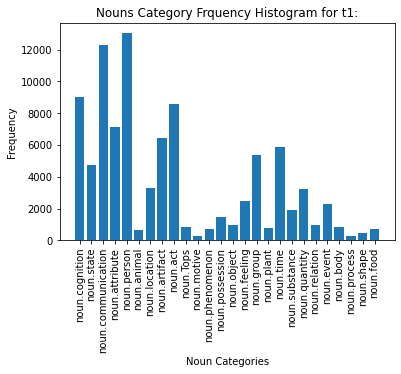

In [31]:
PLOT.bar(range(len(t1_noun_dict)), list(t1_noun_dict.values()))
PLOT.xticks(range(len(t1_noun_dict)), list(t1_noun_dict.keys()), rotation = 90)
PLOT.xlabel("Noun Categories")
PLOT.ylabel("Frequency")
PLOT.title("Nouns Category Frquency Histogram for t1:")
PLOT.show()

Similarly, for t1 verbs:

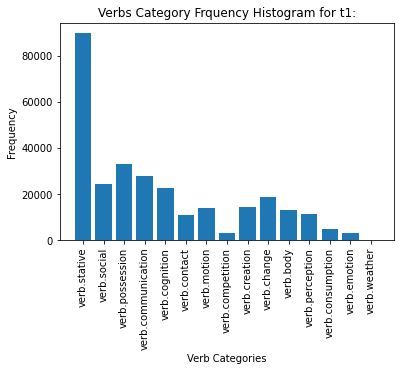

In [32]:
PLOT.bar(range(len(t1_verb_dict)), list(t1_verb_dict.values()))
PLOT.xticks(range(len(t1_verb_dict)), list(t1_verb_dict.keys()), rotation = 90)
PLOT.xlabel("Verb Categories")
PLOT.ylabel("Frequency")
PLOT.title("Verbs Category Frquency Histogram for t1:")
PLOT.show()

Similarly, for t2 the whole procedure of categorizing nouns and verbs:

For t2: categorzing nouns:

In [33]:
t2_nouns = []
for item in t2_tags:
    if(item[1]=="NN" or item[1]=="NNP" or item[1]=="NNPS" or item[1]=="NNS"):
        t2_nouns.append(item)
print(len(t2_nouns))

t2_noun_dict={}
for item in t2_nouns:
    syn=wordnet.synsets(item[0])
    for i in syn:
        if i.lexname()[0]=='n':
            if i.lexname() in t2_noun_dict:
                t2_noun_dict[i.lexname()] += 1
            else:
                t2_noun_dict[i.lexname()] = 1
print(t2_noun_dict)

14757
{'noun.communication': 7385, 'noun.person': 10273, 'noun.time': 3175, 'noun.event': 1406, 'noun.cognition': 4506, 'noun.motive': 166, 'noun.state': 2676, 'noun.food': 422, 'noun.group': 2687, 'noun.artifact': 7377, 'noun.object': 1433, 'noun.substance': 1555, 'noun.quantity': 2478, 'noun.plant': 265, 'noun.body': 1255, 'noun.act': 4424, 'noun.attribute': 3280, 'noun.possession': 654, 'noun.process': 120, 'noun.animal': 956, 'noun.phenomenon': 646, 'noun.location': 2799, 'noun.relation': 396, 'noun.feeling': 650, 'noun.Tops': 434, 'noun.shape': 352}


For t2: categorizing verbs:

In [34]:
t2_verbs = []
for item in t2_tags:
    if(item[1]=="VB" or item[1]=="VBD" or item[1]=="VBG" or item[1]=="VBN" or item[1]=="VBP"or item[1]=="VBZ"):
        t2_verbs.append(item)
print(len(t2_verbs))

t2_verb_dict={}
for item in t2_verbs:
    syn=wordnet.synsets(item[0])
    for i in syn:
        if i.lexname()[0]=='v':
            if i.lexname() in t2_verb_dict:
                t2_verb_dict[i.lexname()] += 1
            else:
                t2_verb_dict[i.lexname()] = 1
print(t2_verb_dict)
print(len(t2_verb_dict))

11801
{'verb.stative': 41634, 'verb.social': 11684, 'verb.possession': 15997, 'verb.change': 10516, 'verb.communication': 12698, 'verb.contact': 7290, 'verb.cognition': 9981, 'verb.competition': 2207, 'verb.creation': 6818, 'verb.consumption': 2502, 'verb.perception': 5948, 'verb.body': 6705, 'verb.motion': 8978, 'verb.emotion': 1112, 'verb.weather': 180}
15


For t2: plotting histograms for noun and verb categories:
for nouns:

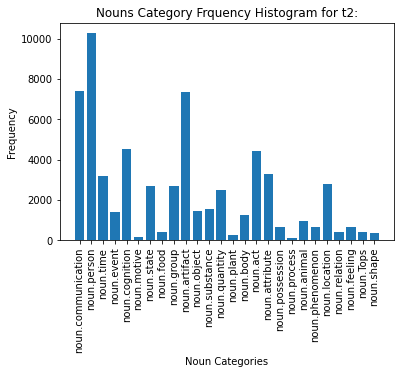

In [35]:
PLOT.bar(range(len(t2_noun_dict)), list(t2_noun_dict.values()))
PLOT.xticks(range(len(t2_noun_dict)), list(t2_noun_dict.keys()), rotation = 90)
PLOT.xlabel("Noun Categories")
PLOT.ylabel("Frequency")
PLOT.title("Nouns Category Frquency Histogram for t2:")
PLOT.show()

for verbs:

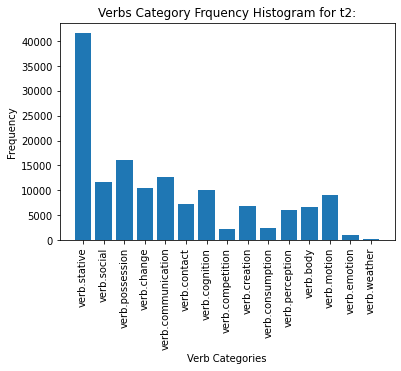

In [36]:
PLOT.bar(range(len(t2_verb_dict)), list(t2_verb_dict.values()))
PLOT.xticks(range(len(t2_verb_dict)), list(t2_verb_dict.keys()), rotation = 90)
PLOT.xlabel("Verb Categories")
PLOT.ylabel("Frequency")
PLOT.title("Verbs Category Frquency Histogram for t2:")
PLOT.show()

Now for recognising entities and their types:

For t1: Recognising all entities:

In [37]:
import spacy
from spacy import displacy
import en_core_web_sm
nlp = en_core_web_sm.load()

In [38]:
document = nlp(t1_join)
print([(x.text, x.label_) for x in document.ents])

[('first', 'ORDINAL'), ('Bennet', 'PERSON'), ('one day', 'DATE'), ('Netherfield Park', 'FAC'), ('Bennet', 'PERSON'), ('Long', 'PERSON'), ('Bennet', 'PERSON'), ('Long', 'PERSON'), ('Netherfield', 'PERSON'), ('England', 'GPE'), ('Monday', 'DATE'), ('four', 'CARDINAL'), ('Morris', 'PERSON'), ('Michaelmas', 'DATE'), ('the end of next week', 'DATE'), ('Bingley', 'WORK_OF_ART'), ('four or five thousand', 'CARDINAL'), ('Bennet', 'PERSON'), ('one', 'CARDINAL'), ('one', 'CARDINAL'), ('Bingley', 'PERSON'), ('five', 'CARDINAL'), ('Bingley', 'PERSON'), ('one', 'CARDINAL'), ('William', 'PERSON'), ('Lady Lucas', 'PERSON'), ('Bingley', 'PERSON'), ('Lizzy', 'PERSON'), ('Lizzy', 'PERSON'), ('half', 'CARDINAL'), ('Jane', 'PERSON'), ('half', 'CARDINAL'), ('Lydia', 'ORG'), ('Lizzy', 'PERSON'), ('Bennet', 'PERSON'), ('these twenty years', 'DATE'), ('four thousand a year', 'DATE'), ('twenty', 'CARDINAL'), ('twenty', 'CARDINAL'), ('Bennet', 'PERSON'), ('three', 'CARDINAL'), ('Bennet', 'PERSON'), ('Bingley', 

In [39]:
entity_list = {}
entity_list = [(X.text, X.label_) for X in document.ents]
print("Entities of first 100 words in the novel : \n")
print(entity_list[:100])

Entities of first 100 words in the novel : 

[('first', 'ORDINAL'), ('Bennet', 'PERSON'), ('one day', 'DATE'), ('Netherfield Park', 'FAC'), ('Bennet', 'PERSON'), ('Long', 'PERSON'), ('Bennet', 'PERSON'), ('Long', 'PERSON'), ('Netherfield', 'PERSON'), ('England', 'GPE'), ('Monday', 'DATE'), ('four', 'CARDINAL'), ('Morris', 'PERSON'), ('Michaelmas', 'DATE'), ('the end of next week', 'DATE'), ('Bingley', 'WORK_OF_ART'), ('four or five thousand', 'CARDINAL'), ('Bennet', 'PERSON'), ('one', 'CARDINAL'), ('one', 'CARDINAL'), ('Bingley', 'PERSON'), ('five', 'CARDINAL'), ('Bingley', 'PERSON'), ('one', 'CARDINAL'), ('William', 'PERSON'), ('Lady Lucas', 'PERSON'), ('Bingley', 'PERSON'), ('Lizzy', 'PERSON'), ('Lizzy', 'PERSON'), ('half', 'CARDINAL'), ('Jane', 'PERSON'), ('half', 'CARDINAL'), ('Lydia', 'ORG'), ('Lizzy', 'PERSON'), ('Bennet', 'PERSON'), ('these twenty years', 'DATE'), ('four thousand a year', 'DATE'), ('twenty', 'CARDINAL'), ('twenty', 'CARDINAL'), ('Bennet', 'PERSON'), ('three', 'C

In [40]:
entity_person = [X for X in entity_list if X[1]=='PERSON']
entity_organisation = [X for X in entity_list if X[1]=='ORG']
entity_location = [X for X in entity_list if X[1]=='LOC']
print(entity_person[:10])
print(entity_location[:10])

[('Bennet', 'PERSON'), ('Bennet', 'PERSON'), ('Long', 'PERSON'), ('Bennet', 'PERSON'), ('Long', 'PERSON'), ('Netherfield', 'PERSON'), ('Morris', 'PERSON'), ('Bennet', 'PERSON'), ('Bingley', 'PERSON'), ('Bingley', 'PERSON')]
[('Pemberley', 'LOC'), ('Pemberley', 'LOC'), ('Pemberley', 'LOC'), ('Pemberley', 'LOC'), ('Pemberley', 'LOC'), ('Pemberley', 'LOC'), ('Bingley', 'LOC'), ('Pemberley', 'LOC'), ('Gracechurch Street', 'LOC'), ('Bingley', 'LOC')]


In [41]:
print('Total entities for Persons are : ' + str(len(entity_person)))
print('Total entities for Organisations are : ' + str(len(entity_organisation)))
print('Total entities for Locations are : ' + str(len(entity_location)))

Total entities for Persons are : 3023
Total entities for Organisations are : 573
Total entities for Locations are : 43


Performance measure:

In [42]:
txt = t1_join[18000:20000]
doc = nlp(txt)
entity_list = {}
entity_list = [(X.text, X.label_) for X in doc.ents]
entity_person = [X for X in entity_list if X[1]=='PERSON']
entity_organisation = [X for X in entity_list if X[1]=='ORG']
entity_location = [X for X in entity_list if X[1]=='LOC']
print('Person as entity')
print()
print(entity_person)
print()
print('Organization as entity')
print()
print(entity_organisation)
print()
print('Location as entity')
print()
print(entity_location)

Person as entity

[('Jane', 'PERSON'), ('Elizabeth', 'PERSON'), ('Bingley', 'PERSON'), ('Elizabeth', 'PERSON')]

Organization as entity

[]

Location as entity

[]


Similarly, for t2: Recognising the entities and measuring the performance of the method:

In [43]:
document = nlp(t2_join)
print([(x.text, x.label_) for x in document.ents])
entity_list = {}
entity_list = [(X.text, X.label_) for X in document.ents]
print("Entities of first 100 words in the novel : \n")
print(entity_list[:100])

entity_person = [X for X in entity_list if X[1]=='PERSON']
entity_organisation = [X for X in entity_list if X[1]=='ORG']
entity_location = [X for X in entity_list if X[1]=='LOC']
print(entity_person[:10])

print('Total entities for Persons are : ' + str(len(entity_person)))
print('Total entities for Organisations are : ' + str(len(entity_organisation)))
print('Total entities for Locations are : ' + str(len(entity_location)))

txt = t2_join[15000:18000]
doc = nlp(txt)
entity_list = {}
entity_list = [(X.text, X.label_) for X in doc.ents]
entity_person = [X for X in entity_list if X[1]=='PERSON']
entity_organisation = [X for X in entity_list if X[1]=='ORG']
entity_location = [X for X in entity_list if X[1]=='LOC']
print('Person as entity')
print()
print(entity_person)
print()
print('Organization as entity')
print()
print(entity_organisation)
print()
print('Location as entity')
print()
print(entity_location)

[('Sherlock Holmes', 'PERSON'), ('stick', 'FAC'), ('the night before', 'TIME'), ('Penang', 'GPE'), ('James Mortimer', 'PERSON'), ('M.R.C.S.', 'GPE'), ('C.C.H.', 'ORG'), ('1884', 'DATE'), ('Watson', 'PERSON'), ('Holmes', 'PERSON'), ('Watson', 'PERSON'), ('Mortimer', 'PERSON'), ('Holmes', 'PERSON'), ('Holmes', 'PERSON'), ('Really, Watson', 'WORK_OF_ART'), ('Holmes', 'PERSON'), ('a few minutes', 'TIME'), ('one', 'CARDINAL'), ('two', 'CARDINAL'), ('stick', 'FAC'), ('Watson', 'PERSON'), ('Watson', 'PERSON'), ('‘Charing Cross', 'ORG'), ('‘Charing Cross Hospital', 'ORG'), ('Mortimer', 'PERSON'), ('London', 'GPE'), ('five years ago', 'DATE'), ('Watson', 'PERSON'), ('Sherlock Holmes', 'ORG'), ('the Medical Directory', 'ORG'), ('Mortimers', 'ORG'), ('only one', 'CARDINAL'), ('Mortimer, James, M.R.C.S., 1882, Grimpen, Dartmoor, Devon.', 'WORK_OF_ART'), ('House', 'ORG'), ('1882', 'DATE'), ('1884', 'DATE'), ('Charing Cross Hospital', 'ORG'), ('Jackson', 'PERSON'), ('Comparative Pathology', 'ORG'), 

Now finding similarity between the previous two books and another book:

We have taken the third book which is " The Jungle Book" by Rudyard Kipling

First we have extracted the required text and done the rest of the preprocessing on third book t3(B3):

In [44]:
url3 = "https://www.gutenberg.org/files/236/236-0.txt"
t3 = urlopen(url3).read()
raw_t3 = t3.decode('utf-8')
line_array_t3 = raw_t3.splitlines()

index_start = 0
index_end = 0
for line in line_array_t3[0:]:
    if line == "Mowgli’s Brothers":
        print(index_start)
    if line == "*** END OF THIS PROJECT GUTENBERG EBOOK THE JUNGLE BOOK ***":
        print(index_end)
        break
    index_start += 1
    index_end += 1

56
5446


In [45]:
temp_t3 = line_array_t3[56:5447]
t3_join = ''.join(temp_t3)
t3_join = t3_join.replace('      ',' ')
t3_join = t3_join.replace('     ',' ')
t3_join = t3_join.replace('    ',' ')
t3_join = t3_join.replace('   ',' ')
t3_toks = nltk.word_tokenize(t3_join)
t3_join[:1000]

'Mowgli’s Brothers Now Rann the Kite brings home the night That Mang the Bat sets free-- The herds are shut in byre and hut For loosed till dawn are we. This is the hour of pride and power, Talon and tush and claw. Oh, hear the call!--Good hunting all That keep the Jungle Law! Night-Song in the JungleIt was seven o’clock of a very warm evening in the Seeonee hills whenFather Wolf woke up from his day’s rest, scratched himself, yawned, andspread out his paws one after the other to get rid of the sleepy feelingin their tips. Mother Wolf lay with her big gray nose dropped across herfour tumbling, squealing cubs, and the moon shone into the mouth of thecave where they all lived. “Augrh!” said Father Wolf. “It is time tohunt again.” He was going to spring down hill when a little shadow witha bushy tail crossed the threshold and whined: “Good luck go with you, OChief of the Wolves. And good luck and strong white teeth go with noblechildren that they may never forget the hungry in this world.

Now we create the tf-idf vectors of all the three books by using their tokens:

In [47]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create TfidfVectorizer object
vectorizer = TfidfVectorizer()

# Generate matrix of word vectors
tfidf_matrix_t1 = vectorizer.fit_transform(t1_toks)
# Print the shape of tfidf_matrix
print(tfidf_matrix_t1.shape)

(142455, 6390)


In [48]:
# Generate matrix of word vectors
#t2_join=[t2_join]
tfidf_matrix_t2 = vectorizer.fit_transform(t2_toks)
# Print the shape of tfidf_matrix
print(tfidf_matrix_t2.shape)

(69364, 5560)


In [49]:
# Generate matrix of word vectors
tfidf_matrix_t3 = vectorizer.fit_transform(t3_toks)
# Print the shape of tfidf_matrix
print(tfidf_matrix_t3.shape)

(58233, 6672)


Then finding the similarity between the tf-idf vectors of all the books:

First between t1 and t2: Also we use the same size of matrix for both of the books otherwise cannot find similarity:

In [50]:
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim_t1_t2 = cosine_similarity(tfidf_matrix_t1[0:69364,0:5560], tfidf_matrix_t2[:,:])
print(cosine_sim_t1_t2)

MemoryError: Unable to allocate 35.8 GiB for an array with shape (69364, 69364) and data type float64

Then similarity between t1 and t3:

In [51]:
cosine_sim_t1_t3 = cosine_similarity(tfidf_matrix_t1[0:58233,:], tfidf_matrix_t3[:,0:6390])
print(cosine_sim_t1_t3)

MemoryError: Unable to allocate 25.3 GiB for an array with shape (58233, 58233) and data type float64

Then similarity between t2 and t3:

In [52]:
cosine_sim_t2_t3 = cosine_similarity(tfidf_matrix_t2[0:58233,:], tfidf_matrix_t3[:,0:5560])
print(cosine_sim_t2_t3)

MemoryError: Unable to allocate 25.3 GiB for an array with shape (58233, 58233) and data type float64

Lemmatization:

In [53]:
import copy
punctuations = "?:!.,;"

for word in t1_toks:
    if word in punctuations:
        t1_toks.remove(word)

from nltk.stem import WordNetLemmatizer
word_lemmatizer = WordNetLemmatizer()

print ("{0:20}{1:20}".format("Word","Lemma"))
for index,word in enumerate(t1_toks):
    print ("{0:20}{1:20}".format(word,word_lemmatizer.lemmatize(word,pos="v")))
    print ("{0:20}{1:20}".format(word,word_lemmatizer.lemmatize(word)))
    t1_toks[index] = word_lemmatizer.lemmatize(word,pos="v")
    t1_toks[index] = word_lemmatizer.lemmatize(word)

Word                Lemma               
it                  it                  
it                  it                  
is                  be                  
is                  is                  
a                   a                   
a                   a                   
truth               truth               
truth               truth               
universally         universally         
universally         universally         
acknowledged        acknowledge         
acknowledged        acknowledged        
that                that                
that                that                
a                   a                   
a                   a                   
single              single              
single              single              
man                 man                 
man                 man                 
in                  in                  
in                  in                  
possession          possession          
possession      

will                will                
like                like                
like                like                
it                  it                  
it                  it                  
lizzy.              lizzy.              
lizzy.              lizzy.              
”                   ”                   
”                   ”                   
“                   “                   
“                   “                   
we                  we                  
we                  we                  
are                 be                  
are                 are                 
not                 not                 
not                 not                 
in                  in                  
in                  in                  
a                   a                   
a                   a                   
way                 way                 
way                 way                 
to                  to                  
to              

being               being               
admitted            admit               
admitted            admitted            
to                  to                  
to                  to                  
a                   a                   
a                   a                   
sight               sight               
sight               sight               
of                  of                  
of                  of                  
the                 the                 
the                 the                 
young               young               
young               young               
ladies              ladies              
ladies              lady                
of                  of                  
of                  of                  
whose               whose               
whose               whose               
beauty              beauty              
beauty              beauty              
he                  he                  
he              

eldest              eldest              
eldest              eldest              
daughter            daughter            
daughter            daughter            
much                much                
much                much                
admired             admire              
admired             admired             
by                  by                  
by                  by                  
the                 the                 
the                 the                 
netherfield         netherfield         
netherfield         netherfield         
party               party               
party               party               
mr.                 mr.                 
mr.                 mr.                 
bingley             bingley             
bingley             bingley             
had                 have                
had                 had                 
danced              dance               
danced              danced              
with            

candid              candid              
candid              candid              
without             without             
without             without             
ostentation         ostentation         
ostentation         ostentation         
or                  or                  
or                  or                  
design—to           design—to           
design—to           design—to           
take                take                
take                take                
the                 the                 
the                 the                 
good                good                
good                good                
of                  of                  
of                  of                  
everybody           everybody           
everybody           everybody           
’                   ’                   
’                   ’                   
s                   s                   
s                   s                   
character       

robinson            robinson            
robinson            robinson            
did                 do                  
did                 did                 
not                 not                 
not                 not                 
i                   i                   
i                   i                   
mention             mention             
mention             mention             
it                  it                  
it                  it                  
to                  to                  
to                  to                  
you                 you                 
you                 you                 
mr.                 mr.                 
mr.                 mr.                 
robinson            robinson            
robinson            robinson            
’                   ’                   
’                   ’                   
s                   s                   
s                   s                   
asking          

a                   a                   
woman               woman               
woman               woman               
conceals            conceal             
conceals            conceals            
her                 her                 
her                 her                 
affection           affection           
affection           affection           
with                with                
with                with                
the                 the                 
the                 the                 
same                same                
same                same                
skill               skill               
skill               skill               
from                from                
from                from                
the                 the                 
the                 the                 
object              object              
object              object              
of                  of                  
of              

subject             subject             
subject             subject             
to                  to                  
to                  to                  
him                 him                 
him                 him                 
which               which               
which               which               
immediately         immediately         
immediately         immediately         
provoking           provoke             
provoking           provoking           
elizabeth           elizabeth           
elizabeth           elizabeth           
to                  to                  
to                  to                  
do                  do                  
do                  do                  
it                  it                  
it                  it                  
she                 she                 
she                 she                 
turned              turn                
turned              turned              
to              

objection           objection           
objection           objection           
i                   i                   
i                   i                   
am                  be                  
am                  am                  
sure                sure                
sure                sure                
to                  to                  
to                  to                  
oblige              oblige              
oblige              oblige              
us                  us                  
us                  u                   
for                 for                 
for                 for                 
one                 one                 
one                 one                 
half-hour.          half-hour.          
half-hour.          half-hour.          
”                   ”                   
”                   ”                   
“                   “                   
“                   “                   
mr              

colonel             colonel             
with                with                
with                with                
five                five                
five                five                
or                  or                  
or                  or                  
six                 six                 
six                 six                 
thousand            thousand            
thousand            thousand            
a                   a                   
a                   a                   
year                year                
year                year                
should              should              
should              should              
want                want                
want                want                
one                 one                 
one                 one                 
of                  of                  
of                  of                  
my                  my                  
my              

she                 she                 
she                 she                 
declared            declare             
declared            declared            
her                 her                 
her                 her                 
resolution          resolution          
resolution          resolution          
“                   “                   
“                   “                   
how                 how                 
how                 how                 
can                 can                 
can                 can                 
you                 you                 
you                 you                 
be                  be                  
be                  be                  
so                  so                  
so                  so                  
silly               silly               
silly               silly               
”                   ”                   
”                   ”                   
cried           

hurst               hurst               
hurst               hurst               
thought             think               
thought             thought             
the                 the                 
the                 the                 
same                same                
same                same                
and                 and                 
and                 and                 
added               add                 
added               added               
“                   “                   
“                   “                   
she                 she                 
she                 she                 
has                 have                
has                 ha                  
nothing             nothing             
nothing             nothing             
in                  in                  
in                  in                  
short               short               
short               short               
to              

yes                 yes                 
yes                 yes                 
all                 all                 
all                 all                 
of                  of                  
of                  of                  
them                them                
them                them                
i                   i                   
i                   i                   
think               think               
think               think               
they                they                
they                they                
all                 all                 
all                 all                 
paint               paint               
paint               paint               
tables              table               
tables              table               
cover               cover               
cover               cover               
screens             screen              
screens             screen              
and             

about               about               
about               about               
the                 the                 
the                 the                 
same                same                
same                same                
time                time                
time                time                
think               think               
think               think               
it                  it                  
it                  it                  
at                  at                  
at                  at                  
all                 all                 
all                 all                 
advisable           advisable           
advisable           advisable           
after               after               
after               after               
sitting             sit                 
sitting             sitting             
a                   a                   
a                   a                   
little          

_my_                _my_                
daughters           daughters           
daughters           daughter            
are                 be                  
are                 are                 
brought             bring               
brought             brought             
up                  up                  
up                  up                  
differently         differently         
differently         differently         
but                 but                 
but                 but                 
everybody           everybody           
everybody           everybody           
is                  be                  
is                  is                  
to                  to                  
to                  to                  
judge               judge               
judge               judge               
for                 for                 
for                 for                 
themselves          themselves          
themselves      

to                  to                  
to                  to                  
my                  my                  
my                  my                  
lot                 lot                 
lot                 lot                 
instead             instead             
instead             instead             
of                  of                  
of                  of                  
to                  to                  
to                  to                  
yours.              yours.              
yours.              yours.              
”                   ”                   
”                   ”                   
“                   “                   
“                   “                   
pray                pray                
pray                pray                
tell                tell                
tell                tell                
your                your                
your                your                
sister          

which               which               
which               which               
is                  be                  
is                  is                  
to                  to                  
to                  to                  
appertain           appertain           
appertain           appertain           
to                  to                  
to                  to                  
this                this                
this                this                
request             request             
request             request             
as                  as                  
as                  a                   
well                well                
well                well                
as                  as                  
as                  a                   
the                 the                 
the                 the                 
degree              degree              
degree              degree              
of              

was                 wa                  
already             already             
already             already             
so                  so                  
so                  so                  
much                much                
much                much                
recovered           recover             
recovered           recovered           
as                  as                  
as                  a                   
to                  to                  
to                  to                  
intend              intend              
intend              intend              
leaving             leave               
leaving             leaving             
her                 her                 
her                 her                 
room                room                
room                room                
for                 for                 
for                 for                 
a                   a                   
a               

other               other               
’                   ’                   
’                   ’                   
s                   s                   
s                   s                   
confidence          confidence          
confidence          confidence          
and                 and                 
and                 and                 
have                have                
have                have                
secret              secret              
secret              secret              
affairs             affairs             
affairs             affair              
to                  to                  
to                  to                  
discuss             discuss             
discuss             discus              
or                  or                  
or                  or                  
because             because             
because             because             
you                 you                 
you             

book                book                
and                 and                 
and                 and                 
would               would               
would               would               
not                 not                 
not                 not                 
even                even                
even                even                
look                look                
look                look                
at                  at                  
at                  at                  
her                 her                 
her                 her                 
on                  on                  
on                  on                  
sunday              sunday              
sunday              sunday              
after               after               
after               after               
morning             morning             
morning             morning             
service             service             
service         

daughters           daughters           
daughters           daughter            
and                 and                 
and                 and                 
beg                 beg                 
beg                 beg                 
leave               leave               
leave               leave               
to                  to                  
to                  to                  
apologise           apologise           
apologise           apologise           
for                 for                 
for                 for                 
it                  it                  
it                  it                  
as                  as                  
as                  a                   
well                well                
well                well                
as                  as                  
as                  a                   
to                  to                  
to                  to                  
assure          

him                 him                 
with                with                
with                with                
some                some                
some                some                
asperity            asperity            
asperity            asperity            
that                that                
that                that                
they                they                
they                they                
were                be                  
were                were                
very                very                
very                very                
well                well                
well                well                
able                able                
able                able                
to                  to                  
to                  to                  
keep                keep                
keep                keep                
a                   a                   
a               

of                  of                  
of                  of                  
an                  an                  
an                  an                  
illiterate          illiterate          
illiterate          illiterate          
and                 and                 
and                 and                 
miserly             miserly             
miserly             miserly             
father              father              
father              father              
and                 and                 
and                 and                 
though              though              
though              though              
he                  he                  
he                  he                  
belonged            belong              
belonged            belonged            
to                  to                  
to                  to                  
one                 one                 
one                 one                 
of              

elizabeth           elizabeth           
happening           happen              
happening           happening           
to                  to                  
to                  to                  
see                 see                 
see                 see                 
the                 the                 
the                 the                 
countenance         countenance         
countenance         countenance         
of                  of                  
of                  of                  
both                both                
both                both                
as                  as                  
as                  a                   
they                they                
they                they                
looked              look                
looked              looked              
at                  at                  
at                  at                  
each                each                
each            

indifferent         indifferent         
imitations          imitations          
imitations          imitation           
of                  of                  
of                  of                  
china               china               
china               china               
on                  on                  
on                  on                  
the                 the                 
the                 the                 
mantelpiece         mantelpiece         
mantelpiece         mantelpiece         
the                 the                 
the                 the                 
interval            interval            
interval            interval            
of                  of                  
of                  of                  
waiting             wait                
waiting             waiting             
appeared            appear              
appeared            appeared            
very                very                
very            

never               never               
be                  be                  
be                  be                  
in                  in                  
in                  in                  
company             company             
company             company             
with                with                
with                with                
this                this                
this                this                
mr.                 mr.                 
mr.                 mr.                 
darcy               darcy               
darcy               darcy               
without             without             
without             without             
being               be                  
being               being               
grieved             grieve              
grieved             grieved             
to                  to                  
to                  to                  
the                 the                 
the             

late                late                
mr.                 mr.                 
mr.                 mr.                 
darcy               darcy               
darcy               darcy               
and                 and                 
and                 and                 
devoted             devote              
devoted             devoted             
all                 all                 
all                 all                 
his                 his                 
his                 his                 
time                time                
time                time                
to                  to                  
to                  to                  
the                 the                 
the                 the                 
care                care                
care                care                
of                  of                  
of                  of                  
the                 the                 
the             

class.              class.              
”                   ”                   
”                   ”                   
elizabeth           elizabeth           
elizabeth           elizabeth           
allowed             allow               
allowed             allowed             
that                that                
that                that                
he                  he                  
he                  he                  
had                 have                
had                 had                 
given               give                
given               given               
a                   a                   
a                   a                   
very                very                
very                very                
rational            rational            
rational            rational            
account             account             
account             account             
of                  of                  
of              

mr.                 mr.                 
mr.                 mr.                 
wickham             wickham             
wickham             wickham             
he                  he                  
he                  he                  
was                 be                  
was                 wa                  
by                  by                  
by                  by                  
no                  no                  
no                  no                  
means               mean                
means               mean                
the                 the                 
the                 the                 
only                only                
only                only                
partner             partner             
partner             partner             
who                 who                 
who                 who                 
could               could               
could               could               
satisfy         

shame               shame               
and                 and                 
and                 and                 
misery              misery              
misery              misery              
which               which               
which               which               
a                   a                   
a                   a                   
disagreeable        disagreeable        
disagreeable        disagreeable        
partner             partner             
partner             partner             
for                 for                 
for                 for                 
a                   a                   
a                   a                   
couple              couple              
couple              couple              
of                  of                  
of                  of                  
dances              dance               
dances              dance               
can                 can                 
can             

else.               else.               
else.               else.               
”                   ”                   
”                   ”                   
“                   “                   
“                   “                   
the                 the                 
the                 the                 
_present_           _present_           
_present_           _present_           
always              always              
always              always              
occupies            occupy              
occupies            occupies            
you                 you                 
you                 you                 
in                  in                  
in                  in                  
such                such                
such                such                
scenes—does         scenes—does         
scenes—does         scenes—does         
it                  it                  
it                  it                  
”               

the                 the                 
the                 the                 
good                good                
good                good                
conduct             conduct             
conduct             conduct             
the                 the                 
the                 the                 
probity             probity             
probity             probity             
and                 and                 
and                 and                 
honour              honour              
honour              honour              
of                  of                  
of                  of                  
his                 his                 
his                 his                 
friend              friend              
friend              friend              
and                 and                 
and                 and                 
is                  be                  
is                  is                  
perfectly       

if                  if                  
hearing             hear                
hearing             hearing             
it                  it                  
it                  it                  
all                 all                 
all                 all                 
and                 and                 
and                 and                 
saw                 saw                 
saw                 saw                 
in                  in                  
in                  in                  
the                 the                 
the                 the                 
motion              motion              
motion              motion              
of                  of                  
of                  of                  
his                 his                 
his                 his                 
lips                lips                
lips                lip                 
the                 the                 
the             

elizabeth           elizabeth           
blushed             blush               
blushed             blushed             
and                 and                 
and                 and                 
blushed             blush               
blushed             blushed             
again               again               
again               again               
with                with                
with                with                
shame               shame               
shame               shame               
and                 and                 
and                 and                 
vexation            vexation            
vexation            vexation            
she                 she                 
she                 she                 
could               could               
could               could               
not                 not                 
not                 not                 
help                help                
help            

of                  of                  
of                  of                  
the                 the                 
the                 the                 
man                 man                 
man                 man                 
who                 who                 
who                 who                 
should              should              
should              should              
omit                omit                
omit                omit                
an                  an                  
an                  an                  
occasion            occasion            
occasion            occasion            
of                  of                  
of                  of                  
testifying          testify             
testifying          testifying          
his                 his                 
his                 his                 
respect             respect             
respect             respect             
towards         

silence             silence             
silence             silence             
as                  as                  
as                  a                   
either              either              
either              either              
mrs.                mrs.                
mrs.                mrs.                
hurst               hurst               
hurst               hurst               
or                  or                  
or                  or                  
miss                miss                
miss                miss                
bingley             bingley             
bingley             bingley             
and                 and                 
and                 and                 
even                even                
even                even                
lydia               lydia               
lydia               lydia               
was                 be                  
was                 wa                  
too             

of                  of                  
of                  of                  
my                  my                  
my                  my                  
discourse           discourse           
discourse           discourse           
however             however             
however             however             
your                your                
your                your                
natural             natural             
natural             natural             
delicacy            delicacy            
delicacy            delicacy            
may                 may                 
may                 may                 
lead                lead                
lead                lead                
you                 you                 
you                 you                 
to                  to                  
to                  to                  
dissemble           dissemble           
dissemble           dissemble           
my              

no                  no                  
no                  no                  
means               mean                
means               mean                
discouraged         discourage          
discouraged         discouraged         
by                  by                  
by                  by                  
what                what                
what                what                
you                 you                 
you                 you                 
have                have                
have                have                
just                just                
just                just                
said                say                 
said                said                
and                 and                 
and                 and                 
shall               shall               
shall               shall               
hope                hope                
hope                hope                
to              

said                said                
as                  as                  
as                  a                   
much                much                
much                much                
to                  to                  
to                  to                  
encourage           encourage           
encourage           encourage           
my                  my                  
my                  my                  
suit                suit                
suit                suit                
as                  as                  
as                  a                   
would               would               
would               would               
be                  be                  
be                  be                  
consistent          consistent          
consistent          consistent          
with                with                
with                with                
the                 the                 
the             

and                 and                 
and                 and                 
herself             herself             
herself             herself             
in                  in                  
in                  in                  
warm                warm                
warm                warm                
terms               term                
terms               term                
on                  on                  
on                  on                  
the                 the                 
the                 the                 
happy               happy               
happy               happy               
prospect            prospect            
prospect            prospect            
of                  of                  
of                  of                  
their               their               
their               their               
nearer              nearer              
nearer              nearer              
connection      

you                 you                 
insist              insist              
insist              insist              
upon                upon                
upon                upon                
her                 her                 
her                 her                 
marrying            marry               
marrying            marrying            
him.                him.                
him.                him.                
”                   ”                   
”                   ”                   
“                   “                   
“                   “                   
let                 let                 
let                 let                 
her                 her                 
her                 her                 
be                  be                  
be                  be                  
called              call                
called              called              
down                down                
down            

endeavoured         endeavour           
endeavoured         endeavoured         
to                  to                  
to                  to                  
secure              secure              
secure              secure              
jane                jane                
jane                jane                
in                  in                  
in                  in                  
her                 her                 
her                 her                 
interest            interest            
interest            interest            
but                 but                 
but                 but                 
jane                jane                
jane                jane                
with                with                
with                with                
all                 all                 
all                 all                 
possible            possible            
possible            possible            
mildness        

window              window              
and                 and                 
and                 and                 
pretending          pretend             
pretending          pretending          
not                 not                 
not                 not                 
to                  to                  
to                  to                  
hear                hear                
hear                hear                
in                  in                  
in                  in                  
a                   a                   
a                   a                   
doleful             doleful             
doleful             doleful             
voice               voice               
voice               voice               
mrs.                mrs.                
mrs.                mrs.                
bennet              bennet              
bennet              bennet              
began               begin               
began           

the                 the                 
the                 the                 
day                 day                 
day                 day                 
to                  to                  
to                  to                  
miss                miss                
miss                miss                
lucas               lucas               
lucas               lucas               
whose               whose               
whose               whose               
civility            civility            
civility            civility            
in                  in                  
in                  in                  
listening           listen              
listening           listening           
to                  to                  
to                  to                  
him                 him                 
him                 him                 
was                 be                  
was                 wa                  
a               

see                 see                 
see                 see                 
your                your                
your                your                
friends             friends             
friends             friend              
before              before              
before              before              
they                they                
they                they                
leave               leave               
leave               leave               
the                 the                 
the                 the                 
country             country             
country             country             
but                 but                 
but                 but                 
may                 may                 
may                 may                 
we                  we                  
we                  we                  
not                 not                 
not                 not                 
hope            

convinced           convinced           
of                  of                  
of                  of                  
her                 her                 
her                 her                 
brother             brother             
brother             brother             
’                   ’                   
’                   ’                   
s                   s                   
s                   s                   
indifference        indifference        
indifference        indifference        
and                 and                 
and                 and                 
that                that                
that                that                
if                  if                  
if                  if                  
she                 she                 
she                 she                 
suspects            suspect             
suspects            suspect             
the                 the                 
the             

again               again               
during              during              
during              during              
the                 the                 
the                 the                 
chief               chief               
chief               chief               
of                  of                  
of                  of                  
the                 the                 
the                 the                 
day                 day                 
day                 day                 
was                 be                  
was                 wa                  
miss                miss                
miss                miss                
lucas               lucas               
lucas               lucas               
so                  so                  
so                  so                  
kind                kind                
kind                kind                
as                  as                  
as              

the                 the                 
the                 the                 
good                good                
good                good                
luck                luck                
luck                luck                
of                  of                  
of                  of                  
it                  it                  
it                  it                  
the                 the                 
the                 the                 
least               least               
least               least               
agreeable           agreeable           
agreeable           agreeable           
circumstance        circumstance        
circumstance        circumstance        
in                  in                  
in                  in                  
the                 the                 
the                 the                 
business            business            
business            business            
was             

all                 all                 
of                  of                  
of                  of                  
them                them                
them                them                
equally             equally             
equally             equally             
surprised           surprise            
surprised           surprised           
that                that                
that                that                
he                  he                  
he                  he                  
meditated           meditate            
meditated           meditated           
a                   a                   
a                   a                   
quick               quick               
quick               quick               
return              return              
return              return              
mrs.                mrs.                
mrs.                mrs.                
bennet              bennet              
bennet          

a                   a                   
stop                stop                
stop                stop                
to                  to                  
to                  to                  
the                 the                 
the                 the                 
exclamations        exclamations        
exclamations        exclamation         
of                  of                  
of                  of                  
her                 her                 
her                 her                 
mother              mother              
mother              mother              
and                 and                 
and                 and                 
sisters             sisters             
sisters             sister              
by                  by                  
by                  by                  
the                 the                 
the                 the                 
earnestness         earnestness         
earnestness     

an                  an                  
an                  an                  
idea                idea                
idea                idea                
so                  so                  
so                  so                  
destructive         destructive         
destructive         destructive         
of                  of                  
of                  of                  
jane                jane                
jane                jane                
’                   ’                   
’                   ’                   
s                   s                   
s                   s                   
happiness           happiness           
happiness           happiness           
and                 and                 
and                 and                 
so                  so                  
so                  so                  
dishonorable        dishonorable        
dishonorable        dishonorable        
to              

himself             himself             
it                  it                  
it                  it                  
was                 be                  
was                 wa                  
a                   a                   
a                   a                   
subject             subject             
subject             subject             
in                  in                  
in                  in                  
short               short               
short               short               
on                  on                  
on                  on                  
which               which               
which               which               
reflection          reflection          
reflection          reflection          
would               would               
would               would               
be                  be                  
be                  be                  
long                long                
long            

but                 but                 
whatever            whatever            
whatever            whatever            
may                 may                 
may                 may                 
be                  be                  
be                  be                  
their               their               
their               their               
own                 own                 
own                 own                 
wishes              wish                
wishes              wish                
it                  it                  
it                  it                  
is                  be                  
is                  is                  
very                very                
very                very                
unlikely            unlikely            
unlikely            unlikely            
they                they                
they                they                
should              should              
should          

the                 the                 
the                 the                 
case                case                
case                case                
unknown             unknown             
unknown             unknown             
to                  to                  
to                  to                  
the                 the                 
the                 the                 
society             society             
society             society             
of                  of                  
of                  of                  
hertfordshire       hertfordshire       
hertfordshire       hertfordshire       
her                 her                 
her                 her                 
mild                mild                
mild                mild                
and                 and                 
and                 and                 
steady              steady              
steady              steady              
candour         

it                  it                  
it                  it                  
is                  be                  
is                  is                  
it                  it                  
it                  it                  
makes               make                
makes               make                
me                  me                  
me                  me                  
very                very                
very                very                
nervous             nervous             
nervous             nervous             
and                 and                 
and                 and                 
poorly              poorly              
poorly              poorly              
to                  to                  
to                  to                  
be                  be                  
be                  be                  
thwarted            thwart              
thwarted            thwarted            
so              

hope                hope                
hope                hope                
”                   ”                   
”                   ”                   
added               add                 
added               added               
mrs.                mrs.                
mrs.                mrs.                
gardiner            gardiner            
gardiner            gardiner            
“                   “                   
“                   “                   
that                that                
that                that                
no                  no                  
no                  no                  
consideration       consideration       
consideration       consideration       
with                with                
with                with                
regard              regard              
regard              regard              
to                  to                  
to                  to                  
this            

would               would               
would               would               
make                make                
make                make                
so                  so                  
so                  so                  
very                very                
very                very                
imprudent           imprudent           
imprudent           imprudent           
i                   i                   
i                   i                   
have                have                
have                have                
nothing             nothing             
nothing             nothing             
to                  to                  
to                  to                  
say                 say                 
say                 say                 
against             against             
against             against             
_him_               _him_               
_him_               _him_               
he              

will                will                
will                will                
you                 you                 
you                 you                 
come                come                
come                come                
and                 and                 
and                 and                 
see                 see                 
see                 see                 
me                  me                  
me                  me                  
”                   ”                   
”                   ”                   
“                   “                   
“                   “                   
we                  we                  
we                  we                  
shall               shall               
shall               shall               
often               often               
often               often               
meet                meet                
meet                meet                
i               

me                  me                  
me                  me                  
but                 but                 
but                 but                 
my                  my                  
my                  my                  
dear                dear                
dear                dear                
sister              sister              
sister              sister              
though              though              
though              though              
the                 the                 
the                 the                 
event               event               
event               event               
has                 have                
has                 ha                  
proved              prove               
proved              proved              
you                 you                 
you                 you                 
right               right               
right               right               
do              

greater             greater             
greater             greater             
pleasure            pleasure            
pleasure            pleasure            
as                  as                  
as                  a                   
well                well                
well                well                
as                  as                  
as                  a                   
greater             greater             
greater             greater             
certainty           certainty           
certainty           certainty           
absence             absence             
absence             absence             
had                 have                
had                 had                 
increased           increase            
increased           increased           
her                 her                 
her                 her                 
desire              desire              
desire              desire              
of              

to                  to                  
to                  to                  
accompany           accompany           
accompany           accompany           
her                 her                 
her                 her                 
uncle               uncle               
uncle               uncle               
and                 and                 
and                 and                 
aunt                aunt                
aunt                aunt                
in                  in                  
in                  in                  
a                   a                   
a                   a                   
tour                tour                
tour                tour                
of                  of                  
of                  of                  
pleasure            pleasure            
pleasure            pleasure            
which               which               
which               which               
they            

william             william             
accompanied         accompany           
accompanied         accompanied         
him                 him                 
him                 him                 
charlotte           charlotte           
charlotte           charlotte           
took                take                
took                took                
her                 her                 
her                 her                 
sister              sister              
sister              sister              
and                 and                 
and                 and                 
friend              friend              
friend              friend              
over                over                
over                over                
the                 the                 
the                 the                 
house               house               
house               house               
extremely           extremely           
extremely       

preserved.          preserved.          
preserved.          preserved.          
”                   ”                   
”                   ”                   
while               while               
while               while               
they                they                
they                they                
were                be                  
were                were                
dressing            dress               
dressing            dressing            
he                  he                  
he                  he                  
came                come                
came                came                
two                 two                 
two                 two                 
or                  or                  
or                  or                  
three               three               
three               three               
times               time                
times               time                
to              

our                 our                 
our                 our                 
instrument          instrument          
instrument          instrument          
is                  be                  
is                  is                  
a                   a                   
a                   a                   
capital             capital             
capital             capital             
one                 one                 
one                 one                 
probably            probably            
probably            probably            
superior            superior            
superior            superior            
to——you             to——you             
to——you             to——you             
shall               shall               
shall               shall               
try                 try                 
try                 try                 
it                  it                  
it                  it                  
some            

deal                deal                
deal                deal                
more                more                
more                more                
passed              pass                
passed              passed              
at                  at                  
at                  at                  
the                 the                 
the                 the                 
other               other               
other               other               
table               table               
table               table               
lady                lady                
lady                lady                
catherine           catherine           
catherine           catherine           
was                 be                  
was                 wa                  
generally           generally           
generally           generally           
speaking—stating    speaking—stating    
speaking—stating    speaking—stating    
the             

were                were                
half-hours          half-hours          
half-hours          half-hour           
of                  of                  
of                  of                  
pleasant            pleasant            
pleasant            pleasant            
conversation        conversation        
conversation        conversation        
with                with                
with                with                
charlotte           charlotte           
charlotte           charlotte           
and                 and                 
and                 and                 
the                 the                 
the                 the                 
weather             weather             
weather             weather             
was                 be                  
was                 wa                  
so                  so                  
so                  so                  
fine                fine                
fine            

and                 and                 
flow                flow                
flow                flow                
as                  as                  
as                  a                   
to                  to                  
to                  to                  
draw                draw                
draw                draw                
the                 the                 
the                 the                 
attention           attention           
attention           attention           
of                  of                  
of                  of                  
lady                lady                
lady                lady                
catherine           catherine           
catherine           catherine           
herself             herself             
herself             herself             
as                  as                  
as                  a                   
well                well                
well            

”                   ”                   
”                   ”                   
said                say                 
said                said                
elizabeth           elizabeth           
elizabeth           elizabeth           
“                   “                   
“                   “                   
do                  do                  
do                  do                  
not                 not                 
not                 not                 
move                move                
move                move                
over                over                
over                over                
this                this                
this                this                
instrument          instrument          
instrument          instrument          
in                  in                  
in                  in                  
the                 the                 
the                 the                 
masterly        

that                that                
that                that                
mr.                 mr.                 
mr.                 mr.                 
bingley             bingley             
bingley             bingley             
has                 have                
has                 ha                  
not                 not                 
not                 not                 
much                much                
much                much                
idea                idea                
idea                idea                
of                  of                  
of                  of                  
ever                ever                
ever                ever                
returning           return              
returning           returning           
to                  to                  
to                  to                  
netherfield         netherfield         
netherfield         netherfield         
again           

kent                kent                
kent                kent                
”                   ”                   
”                   ”                   
a                   a                   
a                   a                   
short               short               
short               short               
dialogue            dialogue            
dialogue            dialogue            
on                  on                  
on                  on                  
the                 the                 
the                 the                 
subject             subject             
subject             subject             
of                  of                  
of                  of                  
the                 the                 
the                 the                 
country             country             
country             country             
ensued              ensue               
ensued              ensued              
on              

no                  no                  
one                 one                 
one                 one                 
else                else                
else                else                
was                 be                  
was                 wa                  
brought             bring               
brought             brought             
and                 and                 
and                 and                 
to                  to                  
to                  to                  
prevent             prevent             
prevent             prevent             
its                 its                 
its                 it                  
ever                ever                
ever                ever                
happening           happen              
happening           happening           
again               again               
again               again               
took                take                
took            

hardships           hardships           
hardships           hardship            
of                  of                  
of                  of                  
that                that                
that                that                
nature              nature              
nature              nature              
but                 but                 
but                 but                 
in                  in                  
in                  in                  
matters             matter              
matters             matter              
of                  of                  
of                  of                  
greater             greater             
greater             greater             
weight              weight              
weight              weight              
i                   i                   
i                   i                   
may                 may                 
may                 may                 
suffer          

to                  to                  
suppose             suppose             
suppose             suppose             
that                that                
that                that                
bingley             bingley             
bingley             bingley             
was                 be                  
was                 wa                  
the                 the                 
the                 the                 
person              person              
person              person              
meant               mean                
meant               meant               
it                  it                  
it                  it                  
was                 be                  
was                 wa                  
all                 all                 
all                 all                 
conjecture.         conjecture.         
conjecture.         conjecture.         
”                   ”                   
”               

father              father              
who                 who                 
who                 who                 
though              though              
though              though              
with                with                
with                with                
some                some                
some                some                
peculiarities       peculiarities       
peculiarities       peculiarity         
has                 have                
has                 ha                  
abilities           abilities           
abilities           ability             
mr.                 mr.                 
mr.                 mr.                 
darcy               darcy               
darcy               darcy               
himself             himself             
himself             himself             
need                need                
need                need                
not                 not                 
not             

little              little              
fluttered           flutter             
fluttered           fluttered           
by                  by                  
by                  by                  
the                 the                 
the                 the                 
idea                idea                
idea                idea                
of                  of                  
of                  of                  
its                 its                 
its                 it                  
being               be                  
being               being               
colonel             colonel             
colonel             colonel             
fitzwilliam         fitzwilliam         
fitzwilliam         fitzwilliam         
himself             himself             
himself             himself             
who                 who                 
who                 who                 
had                 have                
had             

the                 the                 
the                 the                 
pause               pause               
pause               pause               
was                 be                  
was                 wa                  
to                  to                  
to                  to                  
elizabeth           elizabeth           
elizabeth           elizabeth           
’                   ’                   
’                   ’                   
s                   s                   
s                   s                   
feelings            feel                
feelings            feeling             
dreadful            dreadful            
dreadful            dreadful            
at                  at                  
at                  at                  
length              length              
length              length              
with                with                
with                with                
a               

he                  he                  
stopping            stop                
stopping            stopping            
in                  in                  
in                  in                  
his                 his                 
his                 his                 
walk                walk                
walk                walk                
and                 and                 
and                 and                 
turning             turn                
turning             turning             
towards             towards             
towards             towards             
her                 her                 
her                 her                 
“                   “                   
“                   “                   
these               these               
these               these               
offenses            offenses            
offenses            offense             
might               might               
might           

soon                soon                
soon                soon                
overcame            overcome            
overcame            overcame            
the                 the                 
the                 the                 
pity                pity                
pity                pity                
which               which               
which               which               
the                 the                 
the                 the                 
consideration       consideration       
consideration       consideration       
of                  of                  
of                  of                  
his                 his                 
his                 his                 
attachment          attachment          
attachment          attachment          
had                 have                
had                 had                 
for                 for                 
for                 for                 
a               

magnitude           magnitude           
magnitude           magnitude           
you                 you                 
you                 you                 
last                last                
last                last                
night               night               
night               night               
laid                lay                 
laid                laid                
to                  to                  
to                  to                  
my                  my                  
my                  my                  
charge              charge              
charge              charge              
the                 the                 
the                 the                 
first               first               
first               first               
mentioned           mention             
mentioned           mentioned           
was                 be                  
was                 wa                  
that            

causes              cause               
causes              cause               
must                must                
must                must                
be                  be                  
be                  be                  
stated              state               
stated              stated              
though              though              
though              though              
briefly             briefly             
briefly             briefly             
the                 the                 
the                 the                 
situation           situation           
situation           situation           
of                  of                  
of                  of                  
your                your                
your                your                
mother              mother              
mother              mother              
’                   ’                   
’                   ’                   
s               

the                 the                 
the                 the                 
son                 son                 
son                 son                 
of                  of                  
of                  of                  
a                   a                   
a                   a                   
very                very                
very                very                
respectable         respectable         
respectable         respectable         
man                 man                 
man                 man                 
who                 who                 
who                 who                 
had                 have                
had                 had                 
for                 for                 
for                 for                 
many                many                
many                many                
years               years               
years               year                
the             

but                 but                 
last                last                
last                last                
summer              summer              
summer              summer              
he                  he                  
he                  he                  
was                 be                  
was                 wa                  
again               again               
again               again               
most                most                
most                most                
painfully           painfully           
painfully           painfully           
obtruded            obtrude             
obtruded            obtruded            
on                  on                  
on                  on                  
my                  my                  
my                  my                  
notice              notice              
notice              notice              
“                   “                   
“               

was                 be                  
was                 wa                  
she                 she                 
she                 she                 
persuaded           persuade            
persuaded           persuaded           
that                that                
that                that                
he                  he                  
he                  he                  
could               could               
could               could               
have                have                
have                have                
no                  no                  
no                  no                  
explanation         explanation         
explanation         explanation         
to                  to                  
to                  to                  
give                give                
give                give                
which               which               
which               which               
a               

had                 have                
had                 had                 
never               never               
never               never               
heard               hear                
heard               heard               
of                  of                  
of                  of                  
him                 him                 
him                 him                 
before              before              
before              before              
his                 his                 
his                 his                 
entrance            entrance            
entrance            entrance            
into                into                
into                into                
the                 the                 
the                 the                 
——shire             ——shire             
——shire             ——shire             
militia             militia             
militia             militia             
in              

immoral             immoral             
habits              habit               
habits              habit               
that                that                
that                that                
among               among               
among               among               
his                 his                 
his                 his                 
own                 own                 
own                 own                 
connections         connections         
connections         connection          
he                  he                  
he                  he                  
was                 be                  
was                 wa                  
esteemed            esteem              
esteemed            esteemed            
and                 and                 
and                 and                 
valued—that         valued—that         
valued—that         valued—that         
even                even                
even            

she                 she                 
entered             enter               
entered             entered             
the                 the                 
the                 the                 
house               house               
house               house               
with                with                
with                with                
the                 the                 
the                 the                 
wish                wish                
wish                wish                
of                  of                  
of                  of                  
appearing           appear              
appearing           appearing           
cheerful            cheerful            
cheerful            cheerful            
as                  as                  
as                  a                   
usual               usual               
usual               usual               
and                 and                 
and             

lady                lady                
lady                lady                
catherine           catherine           
catherine           catherine           
seemed              seem                
seemed              seemed              
resigned            resign              
resigned            resigned            
“                   “                   
“                   “                   
mrs                 mrs                 
mrs                 mr                  
collins             collins             
collins             collins             
you                 you                 
you                 you                 
must                must                
must                must                
send                send                
send                send                
a                   a                   
a                   a                   
servant             servant             
servant             servant             
with            

her                 her                 
former              former              
former              former              
good                good                
good                good                
opinion             opinion             
opinion             opinion             
heightened          heighten            
heightened          heightened          
the                 the                 
the                 the                 
sense               sense               
sense               sense               
of                  of                  
of                  of                  
what                what                
what                what                
jane                jane                
jane                jane                
had                 have                
had                 had                 
lost                lose                
lost                lost                
his                 his                 
his             

mrs.                mrs.                
collins             collins             
collins             collins             
you                 you                 
you                 you                 
have                have                
have                have                
been                be                  
been                been                
a                   a                   
a                   a                   
daily               daily               
daily               daily               
witness             witness             
witness             witness             
of                  of                  
of                  of                  
and                 and                 
and                 and                 
altogether          altogether          
altogether          altogether          
i                   i                   
i                   i                   
trust               trust               
trust           

’                   ’                   
’                   ’                   
s                   s                   
s                   s                   
for                 for                 
for                 for                 
you                 you                 
you                 you                 
she                 she                 
she                 she                 
is                  be                  
is                  is                  
gone                go                  
gone                gone                
down                down                
down                down                
to                  to                  
to                  to                  
her                 her                 
her                 her                 
uncle               uncle               
uncle               uncle               
at                  at                  
at                  at                  
liverpool       

be                  be                  
said                say                 
said                said                
that                that                
that                that                
the                 the                 
the                 the                 
miss                miss                
miss                miss                
bennets             bennets             
bennets             bennet              
could               could               
could               could               
not                 not                 
not                 not                 
be                  be                  
be                  be                  
at                  at                  
at                  at                  
home                home                
home                home                
half                half                
half                half                
a                   a                   
a               

lizzy               lizzy               
lizzy               lizzy               
when                when                
when                when                
you                 you                 
you                 you                 
first               first               
first               first               
read                read                
read                read                
that                that                
that                that                
letter              letter              
letter              letter              
i                   i                   
i                   i                   
am                  be                  
am                  am                  
sure                sure                
sure                sure                
you                 you                 
you                 you                 
could               could               
could               could               
not             

mention             mention             
before              before              
before              before              
me.                 me.                 
me.                 me.                 
”                   ”                   
”                   ”                   
“                   “                   
“                   “                   
no                  no                  
no                  no                  
it                  it                  
it                  it                  
would               would               
would               would               
have                have                
have                have                
been                be                  
been                been                
strange             strange             
strange             strange             
if                  if                  
if                  if                  
they                they                
they            

lydia               lydia               
lydia               lydia               
leads               lead                
leads               lead                
vain                vain                
vain                vain                
ignorant            ignorant            
ignorant            ignorant            
idle                idle                
idle                idle                
and                 and                 
and                 and                 
absolutely          absolutely          
absolutely          absolutely          
uncontrolled        uncontrolled        
uncontrolled        uncontrolled        
oh                  oh                  
oh                  oh                  
my                  my                  
my                  my                  
dear                dear                
dear                dear                
father              father              
father              father              
can             

manners             manner              
were                be                  
were                were                
in                  in                  
in                  in                  
a                   a                   
a                   a                   
state               state               
state               state               
of                  of                  
of                  of                  
improvement         improvement         
improvement         improvement         
but                 but                 
but                 but                 
that                that                
that                that                
from                from                
from                from                
knowing             know                
knowing             knowing             
him                 him                 
him                 him                 
better              better              
better          

the                 the                 
the                 the                 
first               first               
first               first               
fortnight           fortnight           
fortnight           fortnight           
or                  or                  
or                  or                  
three               three               
three               three               
weeks               weeks               
weeks               week                
of                  of                  
of                  of                  
her                 her                 
her                 her                 
absence             absence             
absence             absence             
health              health              
health              health              
good                good                
good                good                
humour              humour              
humour              humour              
and             

applied             apply               
applied             applied             
to                  to                  
to                  to                  
could               could               
could               could               
readily             readily             
readily             readily             
answer              answer              
answer              answer              
and                 and                 
and                 and                 
with                with                
with                with                
a                   a                   
a                   a                   
proper              proper              
proper              proper              
air                 air                 
air                 air                 
of                  of                  
of                  of                  
indifference        indifference        
indifference        indifference        
that            

darcy               darcy               
darcy               darcy               
drawn               draw                
drawn               drawn               
when                when                
when                when                
she                 she                 
she                 she                 
was                 be                  
was                 wa                  
only                only                
only                only                
eight               eight               
eight               eight               
years               years               
years               year                
old                 old                 
old                 old                 
“                   “                   
“                   “                   
and                 and                 
and                 and                 
is                  be                  
is                  is                  
miss            

his                 his                 
father              father              
father              father              
’                   ’                   
’                   ’                   
s                   s                   
s                   s                   
lifetime            lifetime            
lifetime            lifetime            
there               there               
there               there               
was                 be                  
was                 wa                  
certainly           certainly           
certainly           certainly           
at                  at                  
at                  at                  
this                this                
this                this                
moment              moment              
moment              moment              
in                  in                  
in                  in                  
elizabeth           elizabeth           
elizabeth       

and                 and                 
she                 she                 
she                 she                 
felt                felt                
felt                felt                
the                 the                 
the                 the                 
necessity           necessity           
necessity           necessity           
of                  of                  
of                  of                  
appearing           appear              
appearing           appearing           
more                more                
more                more                
like                like                
like                like                
herself             herself             
herself             herself             
they                they                
they                they                
entered             enter               
entered             entered             
the                 the                 
the             

was                 be                  
was                 wa                  
walking             walk                
walking             walking             
arm-in-arm          arm-in-arm          
arm-in-arm          arm-in-arm          
with                with                
with                with                
elizabeth           elizabeth           
elizabeth           elizabeth           
gave                give                
gave                gave                
her                 her                 
her                 her                 
a                   a                   
a                   a                   
look                look                
look                look                
expressive          expressive          
expressive          expressive          
of                  of                  
of                  of                  
wonder              wonder              
wonder              wonder              
elizabeth       

mile                mile                
behind              behind              
behind              behind              
he                  he                  
he                  he                  
then                then                
then                then                
asked               ask                 
asked               asked               
her                 her                 
her                 her                 
to                  to                  
to                  to                  
walk                walk                
walk                walk                
into                into                
into                into                
the                 the                 
the                 the                 
house—but           house—but           
house—but           house—but           
she                 she                 
she                 she                 
declared            declare             
declared        

virtue.             virtue.             
”                   ”                   
”                   ”                   
elizabeth           elizabeth           
elizabeth           elizabeth           
here                here                
here                here                
felt                felt                
felt                felt                
herself             herself             
herself             herself             
called              call                
called              called              
on                  on                  
on                  on                  
to                  to                  
to                  to                  
say                 say                 
say                 say                 
something           something           
something           something           
in                  in                  
in                  in                  
vindication         vindication         
vindication     

she                 she                 
she                 she                 
was                 be                  
was                 wa                  
less                less                
less                le                  
handsome            handsome            
handsome            handsome            
than                than                
than                than                
her                 her                 
her                 her                 
brother             brother             
brother             brother             
but                 but                 
but                 but                 
there               there               
there               there               
was                 be                  
was                 wa                  
sense               sense               
sense               sense               
and                 and                 
and                 and                 
good            

lead                lead                
lead                lead                
to                  to                  
to                  to                  
the                 the                 
the                 the                 
mention             mention             
mention             mention             
of                  of                  
of                  of                  
her                 her                 
her                 her                 
had                 have                
had                 had                 
he                  he                  
he                  he                  
dared               dare                
dared               dared               
he                  he                  
he                  he                  
observed            observe             
observed            observed            
to                  to                  
to                  to                  
her             

and                 and                 
and                 and                 
then                then                
then                then                
hurried             hurry               
hurried             hurried             
away                away                
away                away                
to                  to                  
to                  to                  
dress               dress               
dress               dress               
but                 but                 
but                 but                 
she                 she                 
she                 she                 
had                 have                
had                 had                 
no                  no                  
no                  no                  
reason              reason              
reason              reason              
to                  to                  
to                  to                  
fear            

intermediate        intermediate        
lawn                lawn                
lawn                lawn                
in                  in                  
in                  in                  
this                this                
this                this                
house               house               
house               house               
they                they                
they                they                
were                be                  
were                were                
received            receive             
received            received            
by                  by                  
by                  by                  
miss                miss                
miss                miss                
darcy               darcy               
darcy               darcy               
who                 who                 
who                 who                 
was                 be                  
was             

her                 her                 
interest            interest            
interest            interest            
in                  in                  
in                  in                  
the                 the                 
the                 the                 
affair              affair              
affair              affair              
and                 and                 
and                 and                 
the                 the                 
the                 the                 
very                very                
very                very                
circumstance        circumstance        
circumstance        circumstance        
which               which               
which               which               
had                 have                
had                 had                 
been                be                  
been                been                
designed            design              
designed        

is                  be                  
is                  is                  
sadly               sadly               
sadly               sadly               
grieved             grieve              
grieved             grieved             
my                  my                  
my                  my                  
father              father              
father              father              
bears               bear                
bears               bear                
it                  it                  
it                  it                  
better              better              
better              better              
how                 how                 
how                 how                 
thankful            thankful            
thankful            thankful            
am                  be                  
am                  am                  
i                   i                   
i                   i                   
that            

father              father              
father              father              
is                  be                  
is                  is                  
going               go                  
going               going               
to                  to                  
to                  to                  
london              london              
london              london              
with                with                
with                with                
colonel             colonel             
colonel             colonel             
forster             forster             
forster             forster             
instantly           instantly           
instantly           instantly           
to                  to                  
to                  to                  
try                 try                 
try                 try                 
to                  to                  
to                  to                  
discover        

my                  my                  
part                part                
part                part                
that                that                
that                that                
might               might               
might               might               
offer               offer               
offer               offer               
consolation         consolation         
consolation         consolation         
to                  to                  
to                  to                  
such                such                
such                such                
distress            distress            
distress            distress            
but                 but                 
but                 but                 
i                   i                   
i                   i                   
will                will                
will                will                
not                 not                 
not             

road                road                
road                road                
to                  to                  
to                  to                  
longbourn           longbourn           
longbourn           longbourn           
“                   “                   
“                   “                   
i                   i                   
i                   i                   
have                have                
have                have                
been                be                  
been                been                
thinking            think               
thinking            thinking            
it                  it                  
it                  it                  
over                over                
over                over                
again               again               
again               again               
elizabeth           elizabeth           
elizabeth           elizabeth           
”               

dispose             dispose             
dispose             dispose             
of                  of                  
of                  of                  
her                 her                 
her                 her                 
time                time                
time                time                
in                  in                  
in                  in                  
the                 the                 
the                 the                 
most                most                
most                most                
idle                idle                
idle                idle                
and                 and                 
and                 and                 
frivolous           frivolous           
frivolous           frivolous           
manner              manner              
manner              manner              
and                 and                 
and                 and                 
to              

hope                hope                
hope                hope                
of                  of                  
of                  of                  
good                good                
good                good                
however             however             
however             however             
which               which               
which               which               
the                 the                 
the                 the                 
benevolence         benevolence         
benevolence         benevolence         
of                  of                  
of                  of                  
her                 her                 
her                 her                 
heart               heart               
heart               heart               
suggested           suggest             
suggested           suggested           
had                 have                
had                 had                 
not             

that                that                
that                that                
she                 she                 
she                 she                 
can                 can                 
can                 can                 
not                 not                 
not                 not                 
be                  be                  
be                  be                  
too                 too                 
too                 too                 
much                much                
much                much                
guarded             guard               
guarded             guarded             
in                  in                  
in                  in                  
her                 her                 
her                 her                 
behaviour           behaviour           
behaviour           behaviour           
towards             towards             
towards             towards             
the             

ten                 ten                 
ten                 ten                 
minutes             minutes             
minutes             minute              
my                  my                  
my                  my                  
mother              mother              
mother              mother              
was                 be                  
was                 wa                  
taken               take                
taken               taken               
ill                 ill                 
ill                 ill                 
immediately         immediately         
immediately         immediately         
and                 and                 
and                 and                 
the                 the                 
the                 the                 
whole               whole               
whole               whole               
house               house               
house               house               
in              

that                that                
mr.                 mr.                 
mr.                 mr.                 
bennet              bennet              
bennet              bennet              
seemed              seem                
seemed              seemed              
wholly              wholly              
wholly              wholly              
disinclined         disincline          
disinclined         disinclined         
at                  at                  
at                  at                  
present             present             
present             present             
to                  to                  
to                  to                  
leave               leave               
leave               leave               
london              london              
london              london              
and                 and                 
and                 and                 
promised            promise             
promised        

good                good                
deal                deal                
deal                deal                
in                  in                  
in                  in                  
town                town                
town                town                
but                 but                 
but                 but                 
his                 his                 
his                 his                 
debts               debts               
debts               debt                
of                  of                  
of                  of                  
honour              honour              
honour              honour              
were                be                  
were                were                
still               still               
still               still               
more                more                
more                more                
formidable          formidable          
formidable      

stir                stir                
out                 out                 
out                 out                 
of                  of                  
of                  of                  
doors               doors               
doors               door                
till                till                
till                till                
you                 you                 
you                 you                 
can                 can                 
can                 can                 
prove               prove               
prove               prove               
that                that                
that                that                
you                 you                 
you                 you                 
have                have                
have                have                
spent               spend               
spent               spent               
ten                 ten                 
ten             

he                  he                  
is                  be                  
is                  is                  
_such_              _such_              
_such_              _such_              
a                   a                   
a                   a                   
man                 man                 
man                 man                 
”                   ”                   
”                   ”                   
“                   “                   
“                   “                   
yes                 yes                 
yes                 yes                 
yes                 yes                 
yes                 yes                 
they                they                
they                they                
must                must                
must                must                
marry               marry               
marry               marry               
there               there               
there           

lizzy               lizzy               
lizzy               lizzy               
my                  my                  
my                  my                  
dear                dear                
dear                dear                
run                 run                 
run                 run                 
down                down                
down                down                
to                  to                  
to                  to                  
your                your                
your                your                
father              father              
father              father              
and                 and                 
and                 and                 
ask                 ask                 
ask                 ask                 
him                 him                 
him                 him                 
how                 how                 
how                 how                 
much            

his                 his                 
his                 his                 
brother             brother             
brother             brother             
though              though              
though              though              
expressed           express             
expressed           expressed           
most                most                
most                most                
concisely           concisely           
concisely           concisely           
he                  he                  
he                  he                  
then                then                
then                then                
delivered           deliver             
delivered           delivered           
on                  on                  
on                  on                  
paper               paper               
paper               paper               
his                 his                 
his                 his                 
perfect         

his                 his                 
his                 his                 
understanding       understand          
understanding       understanding       
and                 and                 
and                 and                 
temper              temper              
temper              temper              
though              though              
though              though              
unlike              unlike              
unlike              unlike              
her                 her                 
her                 her                 
own                 own                 
own                 own                 
would               would               
would               would               
have                have                
have                have                
answered            answer              
answered            answered            
all                 all                 
all                 all                 
her             

dreaded             dread               
dreaded             dreaded             
by                  by                  
by                  by                  
the                 the                 
the                 the                 
elder               elder               
elder               elder               
miss                miss                
miss                miss                
bennets             bennets             
bennets             bennet              
and                 and                 
and                 and                 
jane                jane                
jane                jane                
more                more                
more                more                
especially          especially          
especially          especially          
who                 who                 
who                 who                 
gave                give                
gave                gave                
lydia           

husbands.           husbands.           
husbands.           husbands.           
”                   ”                   
”                   ”                   
their               their               
their               their               
visitors            visitors            
visitors            visitor             
were                be                  
were                were                
not                 not                 
not                 not                 
to                  to                  
to                  to                  
remain              remain              
remain              remain              
above               above               
above               above               
ten                 ten                 
ten                 ten                 
days                days                
days                day                 
with                with                
with                with                
them            

best                best                
best                best                
pleased             please              
pleased             pleased             
her                 her                 
her                 her                 
as                  as                  
as                  a                   
placing             place               
placing             placing             
his                 his                 
his                 his                 
conduct             conduct             
conduct             conduct             
in                  in                  
in                  in                  
the                 the                 
the                 the                 
noblest             noblest             
noblest             noblest             
light               light               
light               light               
seemed              seem                
seemed              seemed              
most            

he                  he                  
he                  he                  
did                 do                  
did                 did                 
not                 not                 
not                 not                 
know                know                
know                know                
where               where               
where               where               
and                 and                 
and                 and                 
he                  he                  
he                  he                  
knew                know                
knew                knew                
he                  he                  
he                  he                  
should              should              
should              should              
have                have                
have                have                
nothing             nothing             
nothing             nothing             
to              

bold                bold                
enough              enough              
enough              enough              
to                  to                  
to                  to                  
say                 say                 
say                 say                 
before              before              
before              before              
)                   )                   
)                   )                   
how                 how                 
how                 how                 
much                much                
much                much                
i                   i                   
i                   i                   
like                like                
like                like                
him                 him                 
him                 him                 
his                 his                 
his                 his                 
behaviour           behaviour           
behaviour       

”                   ”                   
”                   ”                   
“                   “                   
“                   “                   
certainly           certainly           
certainly           certainly           
”                   ”                   
”                   ”                   
he                  he                  
he                  he                  
replied             reply               
replied             replied             
biting              bite                
biting              biting              
his                 his                 
his                 his                 
lips                lips                
lips                lip                 
elizabeth           elizabeth           
elizabeth           elizabeth           
hoped               hop                 
hoped               hoped               
she                 she                 
she                 she                 
had             

want                want                
to                  to                  
to                  to                  
see                 see                 
see                 see                 
him                 him                 
him                 him                 
again               again               
again               again               
but                 but                 
but                 but                 
however             however             
however             however             
he                  he                  
he                  he                  
is                  be                  
is                  is                  
very                very                
very                very                
welcome             welcome             
welcome             welcome             
to                  to                  
to                  to                  
come                come                
come            

it                  it                  
it                  it                  
could               could               
could               could               
she                 she                 
she                 she                 
counted             count               
counted             counted             
the                 the                 
the                 the                 
days                days                
days                day                 
that                that                
that                that                
must                must                
must                must                
intervene           intervene           
intervene           intervene           
before              before              
before              before              
their               their               
their               their               
invitation          invitation          
invitation          invitation          
could           

in                  in                  
in                  in                  
hertfordshire       hertfordshire       
hertfordshire       hertfordshire       
than                than                
than                than                
as                  as                  
as                  a                   
she                 she                 
she                 she                 
had                 have                
had                 had                 
seen                see                 
seen                seen                
him                 him                 
him                 him                 
at                  at                  
at                  at                  
pemberley           pemberley           
pemberley           pemberley           
but                 but                 
but                 but                 
perhaps             perhaps             
perhaps             perhaps             
he              

time                time                
time                time                
mr.                 mr.                 
mr.                 mr.                 
bingley             bingley             
bingley             bingley             
it                  it                  
it                  it                  
is                  be                  
is                  is                  
very                very                
very                very                
hard                hard                
hard                hard                
to                  to                  
to                  to                  
have                have                
have                have                
her                 her                 
her                 her                 
taken               take                
taken               taken               
such                such                
such                such                
a               

a                   a                   
cheerful            cheerful            
cheerful            cheerful            
look                look                
look                look                
which               which               
which               which               
showed              show                
showed              showed              
her                 her                 
her                 her                 
better              better              
better              better              
satisfied           satisfy             
satisfied           satisfied           
with                with                
with                with                
their               their               
their               their               
visitors            visitors            
visitors            visitor             
than                than                
than                than                
elizabeth           elizabeth           
elizabeth       

said                say                 
said                said                
in                  in                  
in                  in                  
a                   a                   
a                   a                   
whisper             whisper             
whisper             whisper             
“                   “                   
“                   “                   
the                 the                 
the                 the                 
men                 men                 
men                 men                 
shan                shan                
shan                shan                
’                   ’                   
’                   ’                   
t                   t                   
t                   t                   
come                come                
come                come                
and                 and                 
and                 and                 
part            

soon                soon                
soon                soon                
as                  as                  
as                  a                   
we                  we                  
we                  we                  
can                 can                 
can                 can                 
”                   ”                   
”                   ”                   
said                say                 
said                said                
jane                jane                
jane                jane                
“                   “                   
“                   “                   
but                 but                 
but                 but                 
i                   i                   
i                   i                   
dare                dare                
dare                dare                
say                 say                 
say                 say                 
kitty           

who                 who                 
who                 who                 
as                  as                  
as                  a                   
well                well                
well                well                
as                  as                  
as                  a                   
the                 the                 
the                 the                 
other               other               
other               other               
had                 have                
had                 had                 
sat                 sit                 
sat                 sat                 
down                down                
down                down                
suddenly            suddenly            
suddenly            suddenly            
rose                rise                
rose                rose                
and                 and                 
and                 and                 
whispering      

time                time                
was                 be                  
was                 wa                  
of                  of                  
of                  of                  
course              course              
course              course              
a                   a                   
a                   a                   
daily               daily               
daily               daily               
visitor             visitor             
visitor             visitor             
at                  at                  
at                  at                  
longbourn           longbourn           
longbourn           longbourn           
coming              come                
coming              coming              
frequently          frequently          
frequently          frequently          
before              before              
before              before              
breakfast           breakfast           
breakfast       

summer              summer              
summer              summer              
the                 the                 
the                 the                 
windows             windows             
windows             window              
are                 be                  
are                 are                 
full                full                
full                full                
west.               west.               
west.               west.               
”                   ”                   
”                   ”                   
mrs.                mrs.                
mrs.                mrs.                
bennet              bennet              
bennet              bennet              
assured             assure              
assured             assured             
her                 her                 
her                 her                 
that                that                
that                that                
they            

behaviour           behaviour           
behaviour           behaviour           
as                  as                  
as                  a                   
this                this                
this                this                
ever                ever                
ever                ever                
induce              induce              
induce              induce              
me                  me                  
me                  me                  
to                  to                  
to                  to                  
be                  be                  
be                  be                  
explicit.           explicit.           
explicit.           explicit.           
”                   ”                   
”                   ”                   
“                   “                   
“                   “                   
let                 let                 
let                 let                 
me              

and                 and                 
on                  on                  
on                  on                  
the                 the                 
the                 the                 
father              father              
father              father              
’                   ’                   
’                   ’                   
s                   s                   
s                   s                   
from                from                
from                from                
respectable         respectable         
respectable         respectable         
honourable          honourable          
honourable          honourable          
and                 and                 
and                 and                 
ancient—though      ancient—though      
ancient—though      ancient—though      
untitled—families   untitled—families   
untitled—families   untitled—families   
their               their               
their           

no                  no                  
such                such                
such                such                
thing               thing               
thing               thing               
i                   i                   
i                   i                   
am                  be                  
am                  am                  
only                only                
only                only                
resolved            resolve             
resolved            resolved            
to                  to                  
to                  to                  
act                 act                 
act                 act                 
in                  in                  
in                  in                  
that                that                
that                that                
manner              manner              
manner              manner              
which               which               
which           

that                that                
it                  it                  
it                  it                  
might               might               
might               might               
be                  be                  
be                  be                  
from                from                
from                from                
lady                lady                
lady                lady                
catherine           catherine           
catherine           catherine           
and                 and                 
and                 and                 
she                 she                 
she                 she                 
anticipated         anticipate          
anticipated         anticipated         
with                with                
with                with                
dismay              dismay              
dismay              dismay              
all                 all                 
all             

and                 and                 
and                 and                 
as                  as                  
as                  a                   
it                  it                  
it                  it                  
had                 have                
had                 had                 
been                be                  
been                been                
asked               ask                 
asked               asked               
without             without             
without             without             
the                 the                 
the                 the                 
least               least               
least               least               
suspicion           suspicion           
suspicion           suspicion           
she                 she                 
she                 she                 
was                 be                  
was                 wa                  
not             

”                   ”                   
”                   ”                   
elizabeth           elizabeth           
elizabeth           elizabeth           
coloured            colour              
coloured            coloured            
and                 and                 
and                 and                 
laughed             laugh               
laughed             laughed             
as                  as                  
as                  a                   
she                 she                 
she                 she                 
replied             reply               
replied             replied             
“                   “                   
“                   “                   
yes                 yes                 
yes                 yes                 
you                 you                 
you                 you                 
know                know                
know                know                
enough          

past                past                
and                 and                 
and                 and                 
i                   i                   
i                   i                   
hoped               hop                 
hoped               hoped               
to                  to                  
to                  to                  
obtain              obtain              
obtain              obtain              
your                your                
your                your                
forgiveness         forgiveness         
forgiveness         forgiveness         
to                  to                  
to                  to                  
lessen              lessen              
lessen              lessen              
your                your                
your                your                
ill                 ill                 
ill                 ill                 
opinion             opinion             
opinion         

remember            remember            
remember            remember            
it                  it                  
it                  it                  
myself.             myself.             
myself.             myself.             
”                   ”                   
”                   ”                   
miss                miss                
miss                miss                
bennet              bennet              
bennet              bennet              
still               still               
still               still               
looked              look                
looked              looked              
all                 all                 
all                 all                 
amazement           amazement           
amazement           amazement           
elizabeth           elizabeth           
elizabeth           elizabeth           
again               again               
again               again               
and             

coming              come                
coming              coming              
here                here                
here                here                
again               again               
again               again               
with                with                
with                with                
our                 our                 
our                 our                 
dear                dear                
dear                dear                
bingley             bingley             
bingley             bingley             
what                what                
what                what                
can                 can                 
can                 can                 
he                  he                  
he                  he                  
mean                mean                
mean                mean                
by                  by                  
by                  by                  
being           

at                  at                  
all                 all                 
all                 all                 
we                  we                  
we                  we                  
all                 all                 
all                 all                 
know                know                
know                know                
him                 him                 
him                 him                 
to                  to                  
to                  to                  
be                  be                  
be                  be                  
a                   a                   
a                   a                   
proud               proud               
proud               proud               
unpleasant          unpleasant          
unpleasant          unpleasant          
sort                sort                
sort                sort                
of                  of                  
of              

then                then                
then                then                
recollected         recollect           
recollected         recollected         
her                 her                 
her                 her                 
embarrassment       embarrassment       
embarrassment       embarrassment       
a                   a                   
a                   a                   
few                 few                 
few                 few                 
days                days                
days                day                 
before              before              
before              before              
on                  on                  
on                  on                  
his                 his                 
his                 his                 
reading             read                
reading             reading             
mr.                 mr.                 
mr.                 mr.                 
collins         

been                been                
left                leave               
left                left                
to                  to                  
to                  to                  
yourself            yourself            
yourself            yourself            
i                   i                   
i                   i                   
wonder              wonder              
wonder              wonder              
when                when                
when                when                
you                 you                 
you                 you                 
_would_             _would_             
_would_             _would_             
have                have                
have                have                
spoken              speak               
spoken              spoken              
if                  if                  
if                  if                  
i                   i                   
i               

nor                 nor                 
was                 be                  
was                 wa                  
her                 her                 
her                 her                 
respect             respect             
respect             respect             
for                 for                 
for                 for                 
him                 him                 
him                 him                 
though              though              
though              though              
it                  it                  
it                  it                  
made                make                
made                made                
her                 her                 
her                 her                 
more                more                
more                more                
quiet               quiet               
quiet               quiet               
at                  at                  
at              

bordering           border              
bordering           bordering           
on                  on                  
on                  on                  
alarm               alarm               
alarm               alarm               
at                  at                  
at                  at                  
her                 her                 
her                 her                 
lively              lively              
lively              lively              
sportive            sportive            
sportive            sportive            
manner              manner              
manner              manner              
of                  of                  
of                  of                  
talking             talk                
talking             talking             
to                  to                  
to                  to                  
her                 her                 
her                 her                 
brother         

To check if the tokens have been updated:

In [54]:
print(t1_toks)

['it', 'is', 'a', 'truth', 'universally', 'acknowledged', 'that', 'a', 'single', 'man', 'in', 'possession', 'of', 'a', 'good', 'fortune', 'must', 'be', 'in', 'want', 'of', 'a', 'wife', 'however', 'little', 'known', 'the', 'feeling', 'or', 'view', 'of', 'such', 'a', 'man', 'may', 'be', 'on', 'his', 'first', 'entering', 'a', 'neighbourhood', 'this', 'truth', 'is', 'so', 'well', 'fixed', 'in', 'the', 'mind', 'of', 'the', 'surrounding', 'family', 'that', 'he', 'is', 'considered', 'a', 'the', 'rightful', 'property', 'of', 'some', 'one', 'or', 'other', 'of', 'their', 'daughter', '“', 'my', 'dear', 'mr.', 'bennet', '”', 'said', 'his', 'lady', 'to', 'him', 'one', 'day', '“', 'have', 'you', 'heard', 'that', 'netherfield', 'park', 'is', 'let', 'at', 'last', '”', 'mr.', 'bennet', 'replied', 'that', 'he', 'had', 'not', '“', 'but', 'it', 'is', '”', 'returned', 'she', '“', 'for', 'mrs.', 'long', 'ha', 'just', 'been', 'here', 'and', 'she', 'told', 'me', 'all', 'about', 'it.', '”', 'mr.', 'bennet', 'm

Lemmatization of t2:

In [ ]:
for word in t2_toks:
    if word in punctuations:
        t2_toks.remove(word)

print ("{0:20}{1:20}".format("Word","Lemma"))
for index,word in enumerate(t2_toks):
    print ("{0:20}{1:20}".format(word,word_lemmatizer.lemmatize(word,pos="v")))
    print ("{0:20}{1:20}".format(word,word_lemmatizer.lemmatize(word)))
    t2_toks[index] = word_lemmatizer.lemmatize(word,pos="v")
    t2_toks[index] = word_lemmatizer.lemmatize(word)

Lemmatization of t3:

In [ ]:
for word in t3_toks:
    if word in punctuations:
        t3_toks.remove(word)

print ("{0:20}{1:20}".format("Word","Lemma"))
for index,word in enumerate(t3_toks):
    print ("{0:20}{1:20}".format(word,word_lemmatizer.lemmatize(word,pos="v")))
    print ("{0:20}{1:20}".format(word,word_lemmatizer.lemmatize(word)))
    t3_toks[index] = word_lemmatizer.lemmatize(word,pos="v")
    t3_toks[index] = word_lemmatizer.lemmatize(word)

In [ ]:
print(t2_toks)

In [ ]:
print(t3_toks)

Now creating tf-idf vectors and finding similarity between books after lemmatization:

In [ ]:
# Generate matrix of word vectors
tfidf_matrix_t1 = vectorizer.fit_transform(t1_toks)
# Print the shape of tfidf_matrix
print(tfidf_matrix_t1.shape)

# Generate matrix of word vectors
tfidf_matrix_t2 = vectorizer.fit_transform(t2_toks)
# Print the shape of tfidf_matrix
print(tfidf_matrix_t2.shape)

# Generate matrix of word vectors
tfidf_matrix_t3 = vectorizer.fit_transform(t3_toks)
# Print the shape of tfidf_matrix
print(tfidf_matrix_t3.shape)

In [ ]:
cosine_sim_t1_t2 = cosine_similarity(tfidf_matrix_t1[0:62673,:], tfidf_matrix_t2[:,0:4824])
print(cosine_sim_t1_t2)

In [ ]:
cosine_sim_t2_t3 = cosine_similarity(tfidf_matrix_t2[0:51897,:], tfidf_matrix_t3[:,0:5160])
print(cosine_sim_t2_t3)

In [ ]:
cosine_sim_t1_t3 = cosine_similarity(tfidf_matrix_t1[0:51897,:], tfidf_matrix_t3[:,0:4824])
print(cosine_sim_t2_t3)